On souhaite **classer des images de cellules sanguines** en utilisant un CNN. Les images sont groupées en 11 classes :

- **BA** : BAsophiles
- **BNE** : NEutrophiles de Bande
- **EO** : EOsinophiles
- **ERB** : ERythroBlastes
- **LY** : LYmphocytes
- **MMY** : MétaMYélocytes
- **MO** : MOnocytes
- **MY** : MYélocytes
- **PLT** : PLaqueTtes
- **PMY** : Promyélocytes
- **SNE** : NEutrophiles Segmentés

L'approche choisie est le **Transfer Learning** : on utilise le modèle **VGG19** et les poids optimisés pour ImageNet. Ensuite, on procède au **fine tuning des dernières couches de VGG19** (le block 5). On utilise notamment Grad-CAM pour analyser les prédictions du modèle.

# Modules, connexion au Drive, vérification du GPU

In [1]:
## Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import cv2
from IPython.display import Image, display
import matplotlib.cm as cm

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')

Mounted at /content/drive


In [2]:
## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Fri Oct 29 13:12:25 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.29.05    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    58W / 149W |    121MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Import et preprocessing des données

## Fonctions

In [3]:
############################ Import Data #################################

def load_and_generate(data_path = './data', train_name = 'df_train.csv', valid_name = 'df_valid.csv', test_name = 'df_test.csv', from_df = True, zip_file = None):
    """
    Pour utiliser sur Google Colab : entrer des valeurs correctes pour data_path et zip_file
    data_path : str, chemin d'accès au répertoire qui contient : 
                   - 'dataset.zip', l'archive qui contient les images (regroupées par classes dans des sous-répertoires)
                   - éventuellement, trois Dataframe (train, valid, test) enregistrés dans des fichiers .csv. Chaque DF contient 2 variables : chemin d'accès ("img_path") + label ("label") de chaque image
                     img_path est exprimé par rapport à la machine virtuelle de Colab, une fois les données transférées. Ex : /content/dataset/EO/5698.jpg
                   
    from_df = bool, True : crée les Dataframe à partir des fichiers .csv indiqués dans train_name, valid_name & test_name. 
                    False : crée puis enregistre les Dataframe à partir des données de dataset.zip.

    train_name, valid_name, test_name : str, 
                   - si from_df = True : nom des fichiers .csv contenant les Dataframe. Ils sont dans le répertoire indiqué dans data_path.
                   - si from_df = False : nom des fichiers .csv dans lesquels la fonction sauvegarde les DFs qu'elle va créer. Ils seront copiés dans le répertoire indiqué dans data_path.

    zip_file : str, nom de l'archive contenant les images.
    """

    ### Import & localisation des données ###
    #'Path' le chemin d'accès aux images stockées sur le Drive :
    data_path = Path(data_path)

    # Importe les images :
    shutil.copy(data_path.joinpath(zip_file), '.')
    print("Import of data is OK.")

    # Dézippe l'archive :
    shutil.unpack_archive(zip_file, Path('/content/dataset'), 'zip')
    print("Unzip is OK.")

    #'Path' le chemin d'accès du répertoire contenant les images, groupées par classes
    picture_path = Path('/content/dataset')



    ### Import ou génération des dataframes ###
    if from_df == True:
        df_train = pd.read_csv(data_path.joinpath(train_name))
        df_valid = pd.read_csv(data_path.joinpath(valid_name))
        df_test  = pd.read_csv(data_path.joinpath(test_name))
        print("Import of DFs is OK.")

    else:
        # Génère les DFs à partir des images :
        df = pd.DataFrame()
        df["img_path"] = [image_path.as_posix() for ext in ['jpg', 'tif', 'tiff', 'png'] for image_path in picture_path.glob(f'**/*.{ext}')]
        df["label"] = [image_path.parts[-2] for ext in ['jpg', 'tif', 'tiff', 'png'] for image_path in picture_path.glob(f'**/*.{ext}')]
        print("DFs are generated ; Number of elements :", len(df))
        print(df.head())

        # Train_Valid_Test_Split :
        df_train, df_valid = train_test_split(df, train_size = 0.8, random_state = 42, stratify = df["label"])
        df_valid, df_test = train_test_split(df_valid, test_size = 0.5, random_state = 42, stratify = df_valid["label"])
        print("Split is OK.")

        # Sauvegarde des DFs :
        df_train.to_csv(train_name, index = False)
        shutil.copy(train_name, data_path)

        df_valid.to_csv(valid_name, index = False)
        shutil.copy(valid_name, data_path)

        df_test.to_csv(test_name, index = False)
        shutil.copy(test_name, data_path)

        print("CSV creation and copy is OK.")

    return df_train, df_valid, df_test

In [4]:
############################ Preprocessing ###############################

def data_pipeline(df_train, df_valid, df_test, batch_size = 32):
  """
  batch_size : int, taille des batchs
  df_train, df_valid, df_test : dataframes produit ou chargés via la fonction load_and_generate
    2 colonnes : "img_path" (chemin d'accès pour chaque image), "label" (type de cellule figurant sur l'image)
  """

  # Augmentation de données à partir du jeu d'entraînement
  train_generator = ImageDataGenerator(rotation_range = 360,
                                       horizontal_flip = True,
                                       vertical_flip = True,
                                       shear_range = 0.1)
  valid_generator = ImageDataGenerator()
  test_generator = ImageDataGenerator()

  # Resize - Batch - Label Encoding - VGG19 Preprocessing
  training_set = train_generator.flow_from_dataframe(df_train,
                                                     directory = None, # utilise df["img_path"]
                                                     x_col = 'img_path',
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width),
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise df["label"]
                                                     class_mode = 'categorical',
                                                     batch_size = batch_size,
                                                     shuffle = True,
                                                     preprocessing_function = preprocess_input)

  validation_set = valid_generator.flow_from_dataframe(df_valid,
                                                       directory = None, # utilise df["img_path"]
                                                       x_col = 'img_path',
                                                       y_col = 'label',
                                                       target_size = (img_height, img_width),
                                                       color_mode = 'rgb',
                                                       classes = None,   # utilise df["label"]
                                                       class_mode = 'categorical',
                                                       batch_size = batch_size,
                                                       shuffle = True,
                                                       preprocessing_function = preprocess_input)

  testing_set = test_generator.flow_from_dataframe(df_test,
                                                   directory = None, # utilise df["img_path"]
                                                   x_col = 'img_path',
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width),
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise df["label"]
                                                   class_mode = 'categorical',
                                                   batch_size = batch_size,
                                                   shuffle = False,
                                                   preprocessing_function = preprocess_input)

  # Récupère l'encodage des labels :
  label_map = training_set.class_indices

  # Récupère les classes et le nombre de classes
  classes = list(df_train["label"].sort_values().unique())
  n_classes = len(classes)

  return training_set, validation_set, testing_set, label_map, n_classes, classes

In [5]:
def find_source(df):
  """
  On utilise le nom des fichiers pour remonter à leur source (Barcelone, Munich, Raabin)
  """
  for i in df.index:
    img_path = df.loc[i,"img_path"]

    if '.tiff' in img_path:
      df.loc[i,"source"] = 'Munich'
    else:
      img_path = img_path.split('/')[-1][:-4].lower()
      
      if img_path.islower():
        df.loc[i,"source"] = 'Barcelone'
      else:
        df.loc[i,"source"] = 'Raabin'

  return df

## Exécution

L'import des données va prendre quelques minutes. Ne pas oublier de changer save_path et data_path en cas d'exécution sur un autre Drive.

In [6]:
# Paramètres :
batch_size = 32
img_height = 360
img_width  = 360

# Répertoire dans lequel seront sauvegardés : le modèle, l'historique d'entraînement.
# Pour ré-entraîner le modèle : merci de changer le save_path, afin d'éviter d'écraser la sauvegarde du modèle.
save_path = "/content/drive/MyDrive/models/vgg19"

# Import des données :
df_train, df_valid, df_test = load_and_generate(data_path = "/content/drive/MyDrive/data", 
                                                train_name = 'df_train.csv',
                                                valid_name = 'df_valid.csv',
                                                test_name  = 'df_test.csv',
                                                from_df = True,
                                                zip_file = 'dataset.zip')

# Preprocessing des données :
training_set, validation_set, testing_set, label_map, n_classes, classes = data_pipeline(df_train, df_valid, df_test, batch_size = 32)

# Quelques informations :
print("Liste des classes, dans l'ordre :", classes)
print("label_map :", label_map)

Import of data is OK.
Unzip is OK.
Import of DFs is OK.
Found 30151 validated image filenames belonging to 11 classes.
Found 3769 validated image filenames belonging to 11 classes.
Found 3769 validated image filenames belonging to 11 classes.
Liste des classes, dans l'ordre : ['BA', 'BNE', 'EO', 'ERB', 'LY', 'MMY', 'MO', 'MY', 'PLT', 'PMY', 'SNE']
label_map : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


## Exploration rapide des données

- Coup d'oeil sur un dataframe :

In [ ]:
df_train.head()

,img_path,label
0,/content/dataset/LY/95-5-11-1_22_1.jpg,LY
1,/content/dataset/LY/LY_961250.jpg,LY
2,/content/dataset/EO/EO_506761.jpg,EO
3,/content/dataset/SNE/NGS_6190.tiff,SNE
4,/content/dataset/MO/MON_0112.tiff,MO


- Déséquilibre important entre certaines classes : LY et SNE sont nettement majoritaires, mais pas au point d'écraser à eux seuls le reste des classes.

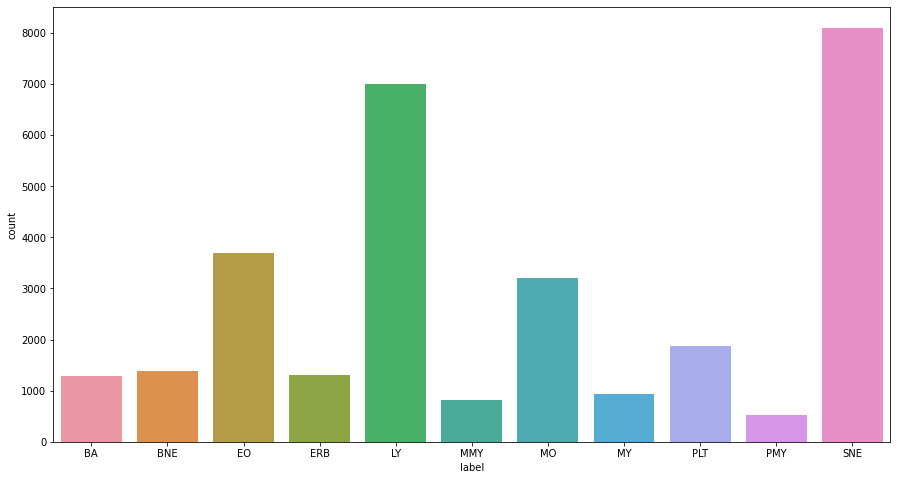

In [ ]:
plt.figure(figsize = (15,8))
sns.countplot(x = "label", data = df_train.sort_values(by = "label"))

In [ ]:
df_train["label"].value_counts(normalize = True)

SNE    0.268780
LY     0.232430
EO     0.122251
MO     0.106232
PLT    0.062286
BNE    0.046234
ERB    0.043216
BA     0.042387
MY     0.031276
MMY    0.027329
PMY    0.017578
Name: label, dtype: float64

- Répartition des données en fonction du dataset d'origine.

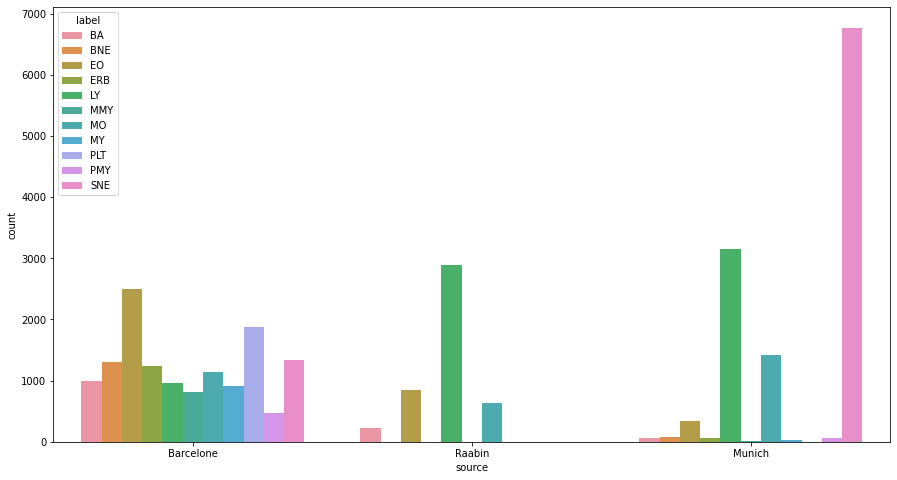

In [ ]:
df_train = find_source(df_train)

plt.figure(figsize = (15,8))
sns.countplot(x = "source", hue = "label", data = df_train.sort_values(by = "label"))

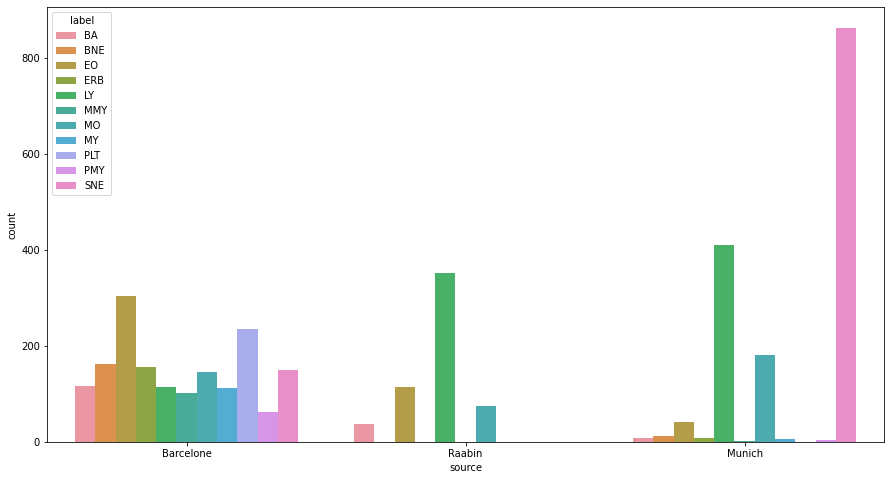

In [ ]:
df_test = find_source(df_test)

plt.figure(figsize = (15,8))
sns.countplot(x = "source", hue = "label", data = df_test.sort_values(by = "label"))

# Construction et Entraînement du modèle

## Fonctions

In [7]:
def compute_weights(training_set):
  counter = Counter(training_set.classes)                       
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()}
  return class_weights

def define_callbacks(min_lr, lr_patience, stopping_patience):
  TON = TerminateOnNaN()
  control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                                 factor = 0.1, 
                                 patience = lr_patience, #2 
                                 verbose = 1, 
                                 mode = 'min', 
                                 min_lr = min_lr)
  early_stopping = EarlyStopping(monitor = "val_loss", 
                                 patience = stopping_patience, #3 
                                 mode = 'min', 
                                 restore_best_weights = True)
  
  callbacks_list = [TON, control_lr, early_stopping]
  return callbacks_list


def build_model(img_height, img_width, n_classes):
  """
  Modèle de transfer-learning : VGG19 + bloc de classification. 
  Poids de VGG19 importés depuis ImageNet. Gel de toutes les couches de VGG19 (base_model) par défaut.

  img_height, img_width : int, valeurs définies au début de l'exécution de training.py. Ne pas toucher.
  n_classes : int, valeur déterminée dans la fonction data_pipeline
  """
  # Base Model (VGG19) :
  inputs = layers.Input(shape = (img_height,img_width,3))
  base_model = VGG19(include_top = False,
                     weights = "imagenet",
                     input_tensor = inputs,
                     input_shape = (img_height,img_width,3),  
                     pooling = 'avg')  
  
  # Freeze VGG19 (doit être fait AVANT de compiler, sinon aucun effet)
  base_model.trainable = False

  #base_model.training = False    
  base_output = base_model.output

  # Classification layers :
  x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
  x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
  x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
  x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
  outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
  model = tf.keras.Model(inputs, outputs)

  return model


def training_curve(training_history, save_path):
  """
  training_history : DataFrame, produit à partir de l'objet History renvoyé par model.fit(). Le DataFrame est renvoyé par train_model.
  Contient : loss, val_loss, accuracy, val_accuracy et learning_rate.
  """

  # Plot
  fig = plt.figure(figsize = (15,8))

  fig.add_subplot(1,2,1)
  plt.plot(training_history["loss"], label = 'Training Set')
  plt.plot(training_history["val_loss"], label = 'Validation Set')
  plt.xticks(fontsize = 12)
  plt.yticks(fontsize = 12)
  plt.xlabel('Epochs', fontsize = 18)
  plt.ylabel('Loss', fontsize = 18)
  plt.legend(fontsize = 18)

  fig.add_subplot(1,2,2)
  plt.plot(training_history["accuracy"], label = 'Training Set')
  plt.plot(training_history["val_accuracy"], label = 'Validation Set')
  plt.xticks(fontsize = 12)
  plt.yticks(fontsize = 12)
  plt.xlabel('Epochs', fontsize = 18)
  plt.ylabel('Accuracy', fontsize = 18)
  plt.legend(fontsize = 18)

  plt.savefig(save_path+'_training_recap')
  return print("Nombre d'epochs %i"%(len(training_history))), fig


def train_model(model, training_set, validation_set, max_epochs, learning_rate, save_path, training_csv_file = 'training_history.csv', fine_tuning = True):
  """
  Entraînement du bloc de classification, puis tuning du block5 de VGG19 :
  model : modèle construit par la fonction build_model()
  training_set, validation_set : générateurs produits par data_pipeline()
  max_epochs : nombre maximal d'epochs (le modèle n'ira sans doute pas jusqu'au bout, du fait de l'EarlyStopping)
      - si fine-tuning = False : max_epochs est le nombre max. d'epochs pour l'entraînement de la partie classification.
      - si fine-tuning = True : max_epochs est le nombre max. d'epochs pour le fine-tuning du modèle.
  learning_rate : taux d'apprentissage pour l'entraînement de la partie classification. Divisé par 100 pour le fine-tuning.
  save_path : chemin d'accès du répertoire dans lequel sauvegarder le modèle (structure, poids, optimiseur)
  training_csv_file : nom du fichier .csv contenant l'historique de l'entraînement. Il sera copié vers save_path.
  """

  # Class Weights :
  class_weights = compute_weights(training_set)
  print("Class Weights :", class_weights)

  # Définit les callbacks (Terminate on NaN, ReduceLROnPLateau, EarlyStopping):
  callbacks_list = define_callbacks(min_lr = 1e-6, lr_patience = 2, stopping_patience = 3)
  print("Callbacks OK.")

  # Compile le modèle :
  optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
  model.compile(optimizer = optimizer, 
                loss = "categorical_crossentropy", 
                metrics = ["accuracy"])
  print("Model compiled : OK.")

  # Définit le nombre d'epochs maximal 
  if fine_tuning :
    training_epochs = 1
    tuning_epochs = max_epochs
  else : 
    training_epochs = max_epochs

  # Train :
  training_history = model.fit(x = training_set,
                               epochs = training_epochs,
                               callbacks = callbacks_list,
                               validation_data = validation_set,
                               class_weight = class_weights)
  print("Model training : OK.")
  training_history = pd.DataFrame(training_history.history)
  print("Save training history : OK.")

  # Fine-Tuning du "Block5"
  if fine_tuning :
    for layer in model.layers:
      if "block5" in layer.name:
        layer.trainable = True

    callbacks_list = define_callbacks(min_lr = 1e-7, lr_patience = 3, stopping_patience = 4)
    optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate*1e-2)
    model.compile(optimizer = optimizer,
                  loss = "categorical_crossentropy",
                  metrics = ["accuracy"])
    
    tuning_history = model.fit(x = training_set,
                               epochs = tuning_epochs,
                               callbacks = callbacks_list,
                               validation_data = validation_set,
                               class_weight = class_weights)
  
  # Sauvegarde du modèle :
  model.save(save_path)
  print("Model saved : OK.")

  # Sauvegarde des objets History :
  tuning_history = pd.DataFrame(tuning_history.history)
  training_history = pd.concat([training_history, tuning_history], axis = 0)
  training_history.reset_index(inplace = True)
  training_history.to_csv(path_or_buf = training_csv_file)
  shutil.copy(training_csv_file, save_path)

  # Plot & Save
  training_curve(training_history, save_path = save_path)

  return model, training_history


## Exécution (ne pas exécuter la cellule ci-dessous): 
**SVP : Ne pas exécuter** la première cellule pour ne pas effacer les résultats.

80150528/80134624 [==============================] - 1s 0us/step
Model built : OK.
Model Summary :
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 360, 360, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 360, 360, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 360, 360, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 180, 180, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 180, 180, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 180, 180, 128)     147584    
____________________________

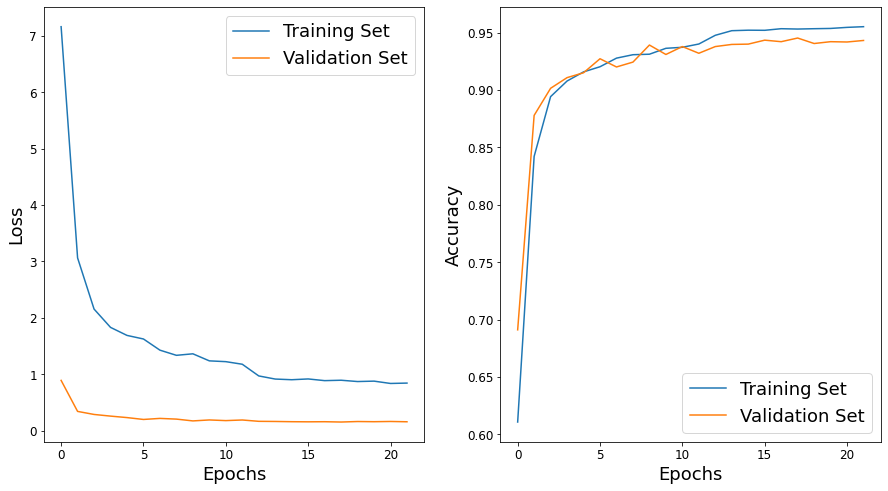

In [ ]:
# Construction du modèle :
model = build_model(img_height,
                    img_width,
                    n_classes)
print("Model built : OK.")
print("Model Summary :")
model.summary()

# Entraînement du modèle :
model, training_history = train_model(model, 
                                      training_set, 
                                      validation_set, 
                                      max_epochs = 100, 
                                      learning_rate = 1e-3, 
                                      save_path = save_path)
print("Training : OK.")

L'écart entre les fonctions de coût calculées pour le jeu d'entraînement et le jeu de validation peut s'expliquer en trois temps :
- d'une part la présence de **couches de Dropout** dans le modèle, qui ne sont actives que pour l'entraînement et non pendant la validation ;
- d'autre part l'**utilisation de class_weight** pour pénaliser les erreurs commises sur les classes minoritaires. Là encore, les poids ne sont utilisés que pendant l'entraînement et non pendant la validation ;
- enfin, l'**augmentation de données** subie par le jeu d'entraînement à chaque epoch.

**Pour relancer l'entraînement sans effacer le log et le graphique, merci de copier la cellule ci-dessus dans la cellule ci-dessous :**

In [ ]:
# Pour entraîner le modèle une seconde fois : ajouter le code ici. Changer le save_path pour ne pas écraser les poids déjà calculés.




# Évaluation et Analyse

Pour éviter de ré-entraîner le modèle, utiliser la fonction load_model dans la cellule ci-dessous. Un modèle pré-entraîné et prêt à être importé se trouve au bout du chemin d'accès :

`save_path = "/content/drive/MyDrive/models/vgg19"`

In [8]:
model = tf.keras.models.load_model(save_path)

Une fois le modèle importé, ré-exécuter les cellules ci-dessous dans l'ordre, sauf mention contraire (**cela prendra quelques minutes**).

## Fonctions

In [9]:
######################################################################## Rapport de classification #######################################################################

def print_classification_report(data_generator, label_map, title, save_path):
  """
  Produit un rapport de classification ainsi que la matrice de confusion.
  - data_generator : objet produit par ImageDataGenerator.flow_from_dataframe, typiquement testing_set. Attention, penser à indiquer shuffle = False dans flow_from_dataframe, sinon les labels prédits seront ordonnés
  dans le désordre par rapport aux labels enregistrés dans le data_generator.
  - label_map : dict, produit par la fonction data_pipeline (correspondance entre label du dataframe et label encodé)
  - title : titre pour la figure produite par la fonction
  - save_path : chemin d'accès pour enregistrer les résultats produits par cette fonction : matrice de confusion, dataframe contenant le rapport de classification
  """

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(data_generator)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(data_generator.classes, y_pred, normalize = 'true')
  classes = range(len(label_map))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(label_map))
  plt.xticks(tick_marks, label_map)
  plt.yticks(tick_marks, label_map)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Labels réels')
  plt.xlabel('Labels prédits')
  plt.savefig(save_path+'_confusion_matrix')

  # Rapport de classification 
  report = classification_report(data_generator.classes, y_pred, target_names = label_map, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  df_report.to_csv(path_or_buf = save_path+'_classif_report'+title)
  print("Classification Report - "+title)
  return y_pred, display(df_report)

In [10]:
def report_overfitting(df, title):
  """
  Matrice de confusion et rapport de classification pour le jeu d'entraînement. Permet d'évaluer plus en détail un éventuel overfitting.
  A utiliser avec le jeu d'entrainement. On utilise les données non-augmentées et classées dans le même ordre que dans le dataframe.
  """
  # Augmentation de données à partir du jeu d'entraînement
  train_generator_ordered = ImageDataGenerator()

  # Resize - Batch - Label Encoding - VGG19 Preprocessing
  training_ordered_set = train_generator_ordered.flow_from_dataframe(df,
                                                                     directory = None,
                                                                     x_col = 'img_path',
                                                                     y_col = 'label',
                                                                     target_size = (img_height, img_width),
                                                                     color_mode = 'rgb',
                                                                     classes = None,
                                                                     class_mode = 'categorical',
                                                                     batch_size = batch_size,
                                                                     shuffle = False, # Important
                                                                     preprocessing_function = preprocess_input)
  
  # Prédiction pour tout le dataset + calcul des métriques et mise en forme
  y_train_pred, df_train_report = print_classification_report(training_ordered_set, label_map, title = title, save_path = save_path)

  return df_train_report


def evaluation(df, y_pred, class_list):

  # Ajoute le nom du dataset d'origine dans le dataframe :
  df = find_source(df)

  # Ajoute le label prédit :
  df["label_pred"] = y_pred
  df["label_pred"] = df["label_pred"].apply(lambda x : class_list[x])

  # Variable "well_classified"
  df["well_classified"] = np.where(df["label"] == df["label_pred"], True, False)

  # Crée des DF contenant seulement les images bien/mal classées
  df_false = df[df["well_classified"] == False].reset_index(drop = True)
  df_true = df[df["well_classified"] == True].reset_index(drop = True)

  return df, df_true, df_false

In [72]:
################################################################################ Grad-CAM ################################################################################

def get_img_array(img_path, size = (img_height, img_width)):
  """
  Importe une image et applique le preprocessing nécessaire à l'utilisation de VGG19 : batch + preprocess_input
  """
  img_array = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  img_array = tf.keras.preprocessing.image.img_to_array(img_array)
  img_array = np.expand_dims(img_array, axis = 0)
  img_array = preprocess_input(img_array)
  return img_array


def get_img_array_2(img_path, size = (img_height, img_width)):

  df_user = pd.DataFrame(data = {"img_path": [img_path],
                                 "label": [None]})
  
  user_generator = ImageDataGenerator()
  user_set = user_generator.flow_from_dataframe(df_user,
                                                x_col='img_path', 
                                                y_col='label',
                                                target_size=(img_height, img_width), 
                                                color_mode='rgb',
                                                classes=None, 
                                                class_mode=None, 
                                                batch_size=batch_size, 
                                                shuffle=False,
                                                preprocessing_function=preprocess_input)
  
  img_array = tf.convert_to_tensor(user_set.__getitem__(0))
  return img_array


def make_heatmap(img_array, model, last_conv_layer, class_index):
  """
  Calcule la CAM (Class Activation Map) correspondant au label d'indice "class_index" pour l'image "img_array"
  model : un modèle déjà entraîné, dont on désactive la fonction d'activation en sortie (fait dans grandcam())
  last_conv_layer : dernière couche de convolution du modèle. Trouvée automatiquement par la fonction gradcam()
  class_index : renseigné dans l'appel de gradcam() ou trouvé automatiquement par gradcam()
  """
  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  # Multiplie chaque carte d'activation par le gradient, puis moyenne
  for i in range(last_conv_layer_output.shape[3]):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)

  return heatmap


def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Désactive softmax sur la dernière couche :
  model.layers[-1].activation = None

  # Détecte la dernière couche de convolution du modèle :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break

  img_array = get_img_array_2(img_path, size = (img_height, img_width))

  # Chargement + preprocessing de l'image (conversion, batch, vgg19 special preprocessing):
  if class_index == None :
    #img_array = get_img_array_2(img_path, size = (img_height, img_width))
    # Trouve la classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour superposition avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap

  # Réactive softmax :
  model.layers[-1].activation = tf.keras.activations.softmax

  ## Traitement de la Heatmap
  # Applique ReLu (élimine les valeurs négatives de la heatmap)
  big_heatmap = np.maximum(0, big_heatmap)
  # Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()

  ## Superposition de l'image et de la heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)
  # 3/ Jet colormap
  jet = cm.get_cmap("jet")
  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  return big_heatmap, superimposed_img

In [12]:
def print_gradcam_allclasses(df, classes, save_path):
  """
  Sélectionne au hasard une image de chaque classe et affiche le Grad-CAM correspondant. Pour avoir des cartes thermiques pertinentes, il vaut mieux que df ne contienne
  que des images bien classées.
  """
  fig_gc = plt.figure(figsize = (30,20))
  i = 1
  for label in classes:

    # Tire un index au hasard parmi les index d'une même classe de cellules
    df_temp = df[df["label"] == label]
    idx = np.random.choice(a = df_temp.index)
        
    img_path = df_temp.loc[idx,"img_path"]

    # Grad-CAM Heatmap + superposition
    big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = classes.index(label), alpha = 0.8, plot = False)

    plt.subplot(4,6,i)
    plt.imshow(plt.imread(img_path))
    plt.title(list(label_map.keys())[classes.index(label)], fontsize = 30)
    plt.grid(None)
    plt.axis('off')

    plt.subplot(4,6,i+1)
    plt.imshow(superimposed_img)
    plt.grid(None)
    plt.axis('off')

    i+=2

  plt.savefig(save_path+'_gc_allclasses')
  return

def print_gradcam_class(df, classes, label, save_path):
  """
  Sélectionne au hasard 4 images bien classées de df, toutes ayant le même label. Affiche le Grad-CAM correspondant à ce label.
  """
  df_temp = df[df["label"] == label]

  fig = plt.figure(figsize = (20,10))
  for i in range(4):
    idx = np.random.choice(a = df_temp.index)
    img_path = df_temp.loc[idx,"img_path"]

    # Grad-CAM
    big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

    plt.subplot(2,4,i+1)
    plt.imshow(superimposed_img)
    plt.grid(None)
    plt.axis('off')

    plt.subplot(2,4,i+5)
    plt.imshow(plt.imread(img_path))
    plt.grid(None)
    plt.axis('off')

    i+=2

  plt.savefig(save_path+'_gc_'+str(label))
  return

def print_gradcam_false(df, classes, false_label, save_path):
  """
  Sélectionne au hasard 4 images mal classées de df (well_classified = False), toutes ayant le même label. Affiche le Grad-CAM correspondant à ce label.
  """

  df_temp = df[(df["well_classified"] == False) & (df["label_pred"] == false_label)]

  fig = plt.figure(figsize = (20,10))
  i = 0
  for idx in np.random.choice(a = df_temp.index, size = 4, replace = False):

    img_path = df_temp.loc[idx,"img_path"]

    # Grad-CAM
    big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = classes.index(false_label), alpha = 0.8, plot = False)

    plt.subplot(2,4,i+1)
    plt.imshow(superimposed_img)
    plt.grid(None)
    plt.axis('off')

    plt.subplot(2,4,i+5)
    plt.imshow(plt.imread(img_path))
    plt.grid(None)
    plt.axis('off')

    i+=1

  plt.savefig(save_path+'_gc_false_'+str(false_label))
  return

## Performances

Commençons par évaluer la performance du modèle de façon globale en calculant l'**accuracy obtenue pour le jeu de test**.

In [13]:
# Évaluation globale :
model.evaluate(testing_set)

118/118 [==============================] - 150s 882ms/step - loss: 0.1648 - accuracy: 0.9438


[0.1648036539554596, 0.9437516331672668]

**Commentaires :**

- L'accuracy globale du modèle est similaire pour les jeux de validation et de test (en réalité deux jeux de test similaires). 

- Elle est inférieure d'un point à celle mesurée pour le jeu d'entraînement : il y a peut-être un léger overfitting.

Passons à un niveau de détail plus élevé, en affichant le **rapport de classification** et la **matrice de confusion** : 

Classification Report - Test


,precision,recall,f1-score,support
BA,0.962733,0.96875,0.965732,160
BNE,0.67907,0.83908,0.750643,174
EO,0.989224,0.995662,0.992432,461
ERB,0.96988,0.98773,0.978723,163
LY,0.978507,0.987443,0.982955,876
MMY,0.706422,0.747573,0.726415,103
MO,0.971722,0.945,0.958175,400
MY,0.765217,0.745763,0.755365,118
PLT,1,1,1,235
PMY,0.760563,0.818182,0.788321,66


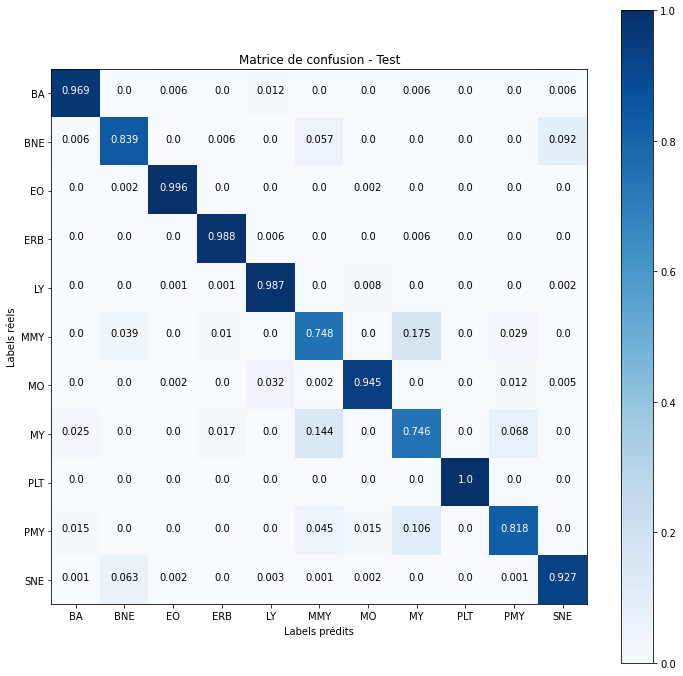

In [14]:
# Détail classe par classe :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test", save_path = save_path)

Des F1-score supérieurs à 95% sont obtenus pour toutes les classes, sauf :
- BNE
- MY
- MMY
- PMY

Ces classes de cellules correspondent en réalité à **des stades différents de la vie d'un même type de cellule** : le granulocyte neutrophile (dont le SNE est la forme mature). 

Soulignons le fait que ces quatre classes sont des classes minoritaires dans le dataset, minoritaires en particulier par rapport à la classe SNE. 

Il y a des raisons pratiques à cela : à l'exception des plaquettes (PLT) et des érythroblastes (ERB), nous essayons de classer des images de globules blancs. 60% des globules blancs sont des neutrophiles, 30% des lymphocytes. Les autres classes se partagent les 10% restants. Les cellules immatures (BNE, MY, MMY, PMY) sont rares : chez un patient sain, elles représentent moins de 1% des globules blancs. Cette proportion va augmenter lorsque le patient est malade : inflammation, infection, cancer. La majorité de nos données proviennent de patients sains (sur les 200 patients du dataset Munich, 100 sont atteints de leucémie ; les autres datasets ne contiennent quasiment que images provenant de patients sains).

La matrice de confusion met en évidence les **principales confusions commises par le modèle**:

- confusion entre les **SNE et les BNE** : rappelons que ces classes de cellules désignent en réalité une même cellule, mais observée à des stades différents de sa vie (le stade de BNE précède immédiatement celui de SNE). Une des principales caractéristiques utilisée pour les distinguer est la **forme du noyau** : un C ou un S d'épaisseur plus ou mois régulière pour un BNE, alors que celui d'un SNE est multilobé, chaque lobe relié à son voisin par un mince filament. Nous ne sommes pas à l'abri de tomber sur des images pour lesquelles le noyau se trouve entre ces deux extrêmes, voire même d'images mal labellisées (comme mis en évidence dans l'article accompagnant le dataset Raabin) ;

- confusion entre **les classes de neutrophiles immatures** : MMY, MY, PMY et BNE (parfois résumées sous le label "IG"). Il s'agît là encore de stades différents de la vie d'un même type de cellule : il est d'ailleurs particulièrement difficile pour un oeil non expérimenté de distinguer les MMY, les MY et les PMY.

On remarque que même si le modèle commet des erreurs au sein de ces ensembles de classes (il va confondre un MY avec un MMY ou un SNE avec un BNE), les confusions entre un neutrophile (SNE, BNE, MY, MMY, PMY) et un autre type de cellule (comme LY, MO, PLT...) sont très rares. **L'erreur commise est donc ciblée et elle a même du sens :**
- 1/ un promyélocyte (PMY) se différencie en myélocyte (MY). Or, la principale erreur commise en classant les PMY est de les considérer comme MY ; 
- 2/ ensuite, le myélocyte se différencie en métamyélocyte (MMY) : on remarque que les deux principales erreurs commises en classant les MY sont de les classer comme PMY (le précurseur) ou comme MMY (le successeur)
- 3/ **le même schéma se répète** lorsqu'on classe les MMY ou les BNE ;
- 4/ l'erreur la plus importante commise en classant les SNE est de les confondre avec les BNE, donc avec le précuseur. Le SNE étant en bout de chaîne, il n'y a pas de successeur avec lequel le confondre.


Les cellules ci-dessous **ajoutent trois colonnes au dataframe de test** :
- source : str, provenance de l'image (Raabin, Munich, Barcelone) 
- label_pred : str, label prédit par le modèle
- well_classified : bool, selon que l'image est classée correctement ou non

In [15]:
df_test, df_true, df_false = evaluation(df_test, y_pred, class_list = classes)

In [16]:
df_test.head()

,img_path,label,source,label_pred,well_classified
0,/content/dataset/BNE/NGB_0025.tiff,BNE,Munich,SNE,False
1,/content/dataset/SNE/SNE_67724.jpg,SNE,Barcelone,SNE,True
2,/content/dataset/LY/LYT_0985.tiff,LY,Munich,LY,True
3,/content/dataset/SNE/NGS_7471.tiff,SNE,Munich,SNE,True
4,/content/dataset/SNE/NGS_5332.tiff,SNE,Munich,SNE,True


### Bonus **(ne pas ré-exécuter : très long)** : commentaires supplémentaires :



- 100% des plaquettes (PLT) du jeu de test sont classées correctement (rappel = 1) et le modèle ne confond pas d'autres images avec des plaquettes (précision = 1). Gardons cependant à l'esprit que les plaquettes sont toutes issues d'un même dataset (Barcelone) dont les images sont de grande qualité. Il faudrait trouver d'autres sources de plaquettes pour avoir une mesure de performance ayant plus de sens. Toutefois, ces cellules se distinguent assez facilement des autres à l'oeil nu : petite taille, absence de noyau. Notre modèle de PLT est évidemment biaisé dans l'état actuel des choses, mais une telle performance pour un dataset plus "général" ne semble pas hors d'atteinte.

- on s'intéresse maintenant à un **éventuel overfitting du modèle, classe par classe** : pour cela, on va utiliser le jeu d'entraînement (sans l'augmentation de données qu'il subit lors de l'entraînement).

**NB :** très long, inutile de ré-exécuter cette cellule pour la suite

Found 30151 validated image filenames belonging to 11 classes.
Classification Report - Train


,precision,recall,f1-score,support
BA,0.977709,0.995305,0.986429,1278
BNE,0.719553,0.92396,0.809045,1394
EO,0.993738,0.990233,0.991983,3686
ERB,0.987102,0.998465,0.992751,1303
LY,0.988565,0.986872,0.987718,7008
MMY,0.856975,0.887136,0.871795,824
MO,0.962677,0.974399,0.968503,3203
MY,0.876712,0.814422,0.84442,943
PLT,1,0.998935,0.999467,1878
PMY,0.811075,0.939623,0.870629,530


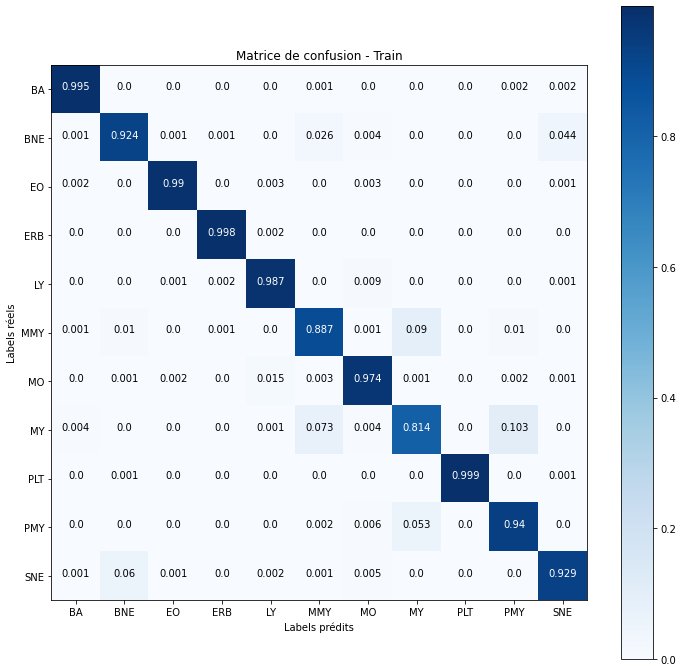

In [ ]:
df_train_report = report_overfitting(df_train, title = "Train")

- **le jeu de validation agît ici comme un deuxième jeu de test**. Ses caractéristiques sont a priori les mêmes que celles du jeu de test (même composition, en terme de classes et de provenance des images). Calculons le rapport de classification pour ce jeu. On s'attend à observer des scores sensiblement identiques à ceux obtenus pour le jeu de test, d'autant plus qu'il y a le même nombre d'images dans chacun des deux jeux.

Found 3769 validated image filenames belonging to 11 classes.
Classification Report - Valid


,precision,recall,f1-score,support
BA,0.963636,0.99375,0.978462,160
BNE,0.672897,0.827586,0.742268,174
EO,0.989107,0.986957,0.98803,460
ERB,0.975904,0.993865,0.984802,163
LY,0.981693,0.979452,0.980571,876
MMY,0.761468,0.805825,0.783019,103
MO,0.945,0.942643,0.94382,401
MY,0.834783,0.813559,0.824034,118
PLT,1,1,1,235
PMY,0.734177,0.878788,0.8,66


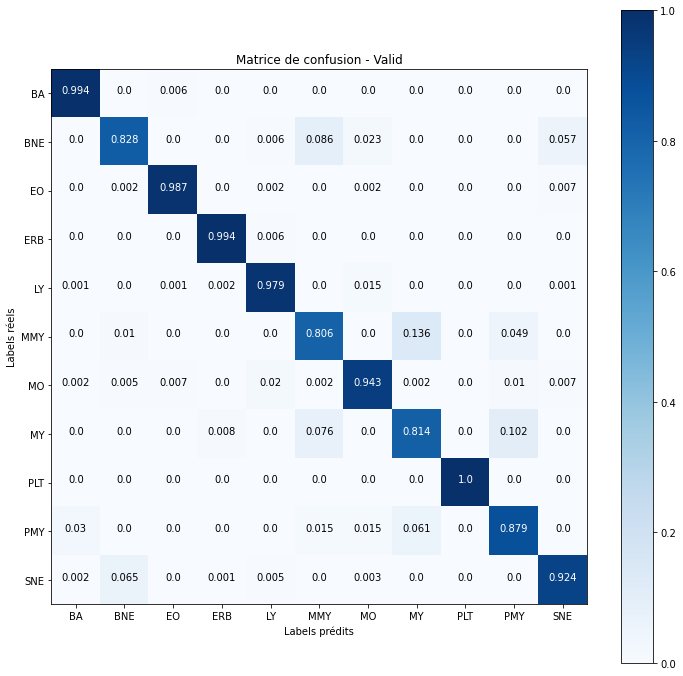

In [ ]:
df_valid_report = report_overfitting(df_valid, title = "Valid")

**Avant d'analyser ces résultats, rappelons la composition du jeu d'entraînement ...**

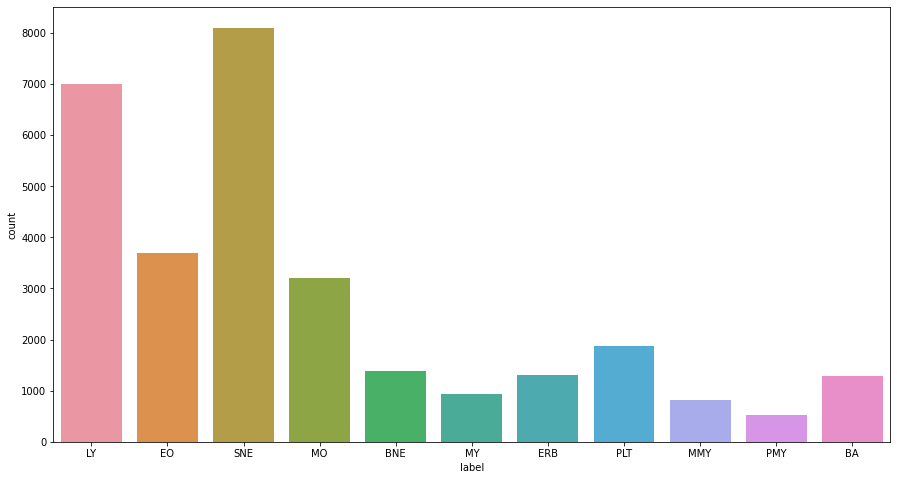

In [ ]:
# Composition globale : classe par classe, tous datasets confondus
plt.figure(figsize = (15,8))
sns.countplot(x = "label", data = df_train)

... et la **composition, classe par classe, pour chaque source de données** prise séparément. Les proportions sont identiques pour les jeux d'entraînement, de test et de validation.

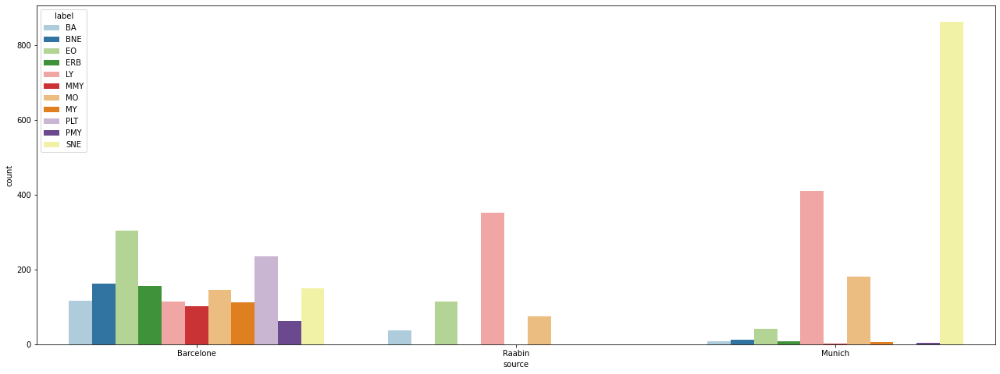

In [ ]:
# Composition classe par classe, pour chaque dataset pris séparément. Gauche : train, droite : test
fig = plt.figure(figsize = (22,8))

sns.countplot(x = "source", hue = "label", data = df_test.sort_values(by = "label"), palette = "Paired")

**Les écarts en termes de F1-Score concernent surtout les classes "difficiles" citées plus haut**, à savoir les granulocytes immatures : PMY, MMY, MY, BNE. Entre le jeu de test et le jeu d'entraînement, ils peuvent être importants Peut-être plus surprenant, il existe des **écarts entre les valeurs de F1-score obtenues pour le jeu de validation et pour le jeu de test**. 

*Normalement, le modèle n'est pas contaminé par l'information du jeu de validation lors de l'entraînement via la méthode .fit() de la classe Model de Keras. Cependant, comme nous utilisons "val_loss" dans les callbacks, et notamment dans l'adaptation du taux d'apprentissage au cours de l'entraînement (ReduceLROnPlateau), il se pourrait qu'il y ait, indirectement, un effet de fuite d'information.*

**Pour des cellules "simples" à identifier "à l'oeil"**, comme les éosinophiles, les lymphocytes, les monocytes, les SNE ou les basophiles, **il n'y a pas ou peu d'écarts**. C'est la même chose pour les PLT ou les ERB, mais nos données manquent de diversité pour ces classes (les images proviennent essentiellement de Barcelone). Le cas des basophiles est intéressant : ces cellules sont plutôt minoritaires dans le dataset et il y en a autant que des BNE. Pourtant l'écart des F1-scores entre les jeux d'entraînement et de test n'est que de 2 points pour les BA alors qu'il est de plus de 5 points pour les BNE. 

Les lignes qui suivent relèvent de l'hypothèse : serait-il possible que ces écarts, notamment entre les jeux de test et de validation, puissent être interprétés en termes d'images mal labellisées, dont la proportion ne serait pas la même d'un jeu à l'autre ? L'existence d'un surapprentissage n'est en effet pas évidente, que ce soit au vu des métriques mesurées pour la plupart des classes, où lorsqu'on regarde l'historique de l'entraînement, en particulier la fonction de coût et l'accuracy globale.



### Bonus **(ne pas ré-exécuter : très long)** : pourcentage d'images bien classées par classe ET par dataset d'origine.

On utilise cette fois l'ensemble des données, pour nous faire une idée supplémentaire quant aux difficultés éprouvées par le modèle.

In [ ]:
def perf_by_source(df_train, df_valid, df_test, classes):

  df = pd.concat([df_train, df_valid, df_test], axis = 0).reset_index()

  full_generator = ImageDataGenerator()
  full_set = full_generator.flow_from_dataframe(df,
                                                directory = None,
                                                x_col = 'img_path',
                                                y_col = 'label',
                                                target_size = (img_height, img_width), 
                                                color_mode = 'rgb',
                                                classes = None,
                                                class_mode = 'categorical', 
                                                batch_size = batch_size,
                                                shuffle = False,
                                                preprocessing_function = preprocess_input)

  # Variable "well_classified"
  y_full_pred = tf.argmax(model.predict(full_set), axis = 1)

  df["label_pred"] = y_full_pred
  df["label_pred"] = df["label_pred"].apply(lambda x : classes[x])

  df["well_classified"] = np.where(df["label"] == df["label_pred"],True,False)

  df = find_source(df)
  df_source = pd.DataFrame(df.groupby(["label","source"])["well_classified"].value_counts(normalize = True))

  return df_source

In [ ]:
perf_by_source(df_train, df_valid, df_test, classes)

Found 37689 validated image filenames belonging to 11 classes.


well_classified
label source    well_classified                 
BA    Barcelone True                    0.998358
                False                   0.001642
      Munich    True                    0.873418
                False                   0.126582
      Raabin    True                    1.000000
BNE   Barcelone True                    0.930190
                False                   0.069810
      Munich    True                    0.541284
                False                   0.458716
EO    Barcelone True                    0.997113
                False                   0.002887
      Munich    True                    0.950472
                False                   0.049528
      Raabin    True                    0.986867
                False                   0.013133
ERB   Barcelone True                    0.999355
                False                   0.000645
      Munich    True                    0.948718
                False                   0.051282
LY    Barcelone True                    0.988468
                False                   0.011532
      Munich    True                    0.982474
                False                   0.017526
      Raabin    True                    0.989471
                False                   0.010529
MMY   Barcelone True                    0.870936
                False                   0.129064
      Munich    False                   0.533333
                True                    0.466667
MO    Barcelone True                    0.978169
                False                   0.021831
      Munich    True                    0.970933
                False                   0.029067
      Raabin    True                    0.944654
                False                   0.055346
MY    Barcelone True                    0.816183
                False                   0.183817
      Munich    True                    0.571429
                False                   0.428571
PLT   Barcelone True                    0.999148
                False                   0.000852
PMY   Barcelone True                    0.918919
                False                   0.081081
      Munich    True                    0.942857
                False                   0.057143
SNE   Barcelone True                    0.668287
                False                   0.331713
      Munich    True                    0.979137
                False                   0.020863

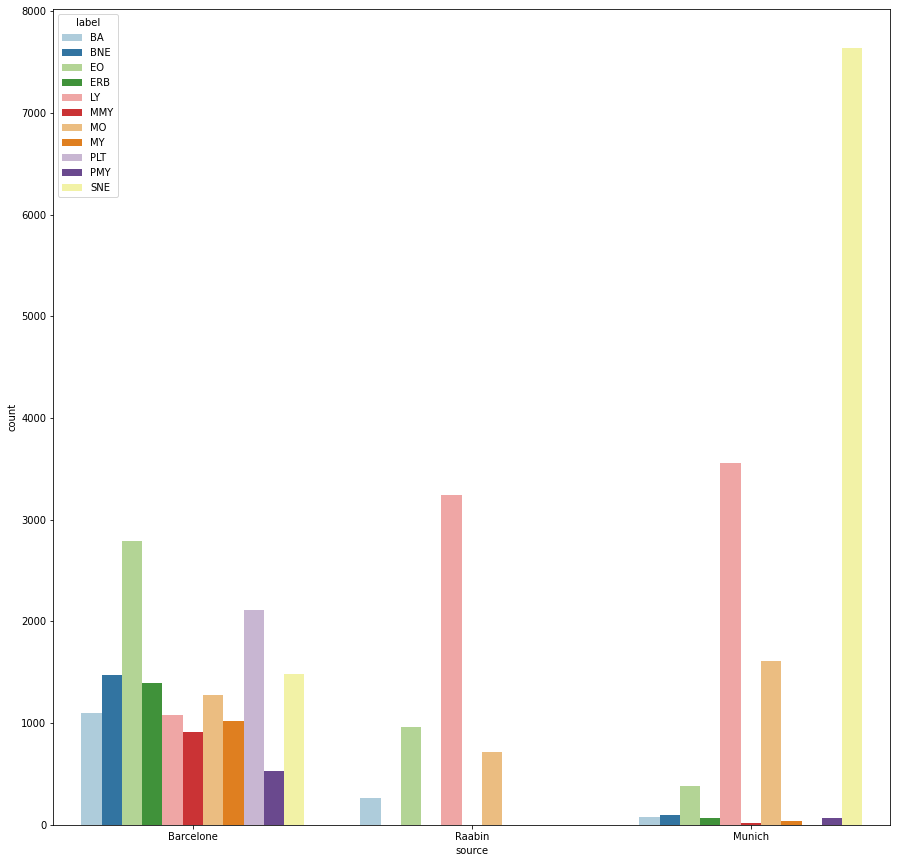

In [ ]:
# Répartition de toutes les images en fonction du label et de la source :

plt.figure(figsize = (15,15))
sns.countplot(x = "source", hue = "label", data = pd.concat([df_train, df_valid, df_test], axis = 0).sort_values(by = "label"), palette = "Paired")

On remarque immédiatement que **la performance du modèle, pour une classe donnée, varie selon la source des images** (Raabin, Munich, Barcelone) : **on pouvait s'y attendre** dans la mesure où la netteté, la coloration, la luminosité des images varie d'une source à l'autre, mais aussi en raison des proportions parfois très différentes d'images de chaque source pour une classe donnée.

Ainsi, on remarque que les BNE de Munich sont assez mal classés : seulement 54% de ces images ont été reconnues comme BNE par le modèle, contre 93% pour les BNE de Barcelone. Pour les SNE, on fait face à la situation contraire : ce sont les images de Munich, en surnombre, qui sont les mieux modélisées.

**Des classes comme les lymphocytes** (LY, 98% d'images classées correctement quelque soit l'origine) **ou les monocytes** (MO, entre 94 et 97% d'images classées correctement quelque soit l'origine), **pour lesquelles notre dataset est plus équilibré** car il contient des proportions comparables d'images provenant de Raabin, Munich et Barcelone, **sont au final bien mieux modélisées**.

On retiendra que **le déséquilibre du dataset en terme de qualité d'images parait finalement bien plus important que le déséquilibre en termes de labels**.

## Exploration avec Grad-CAM

### Images bien classées - 1 échantillon par classe

Nous allons commencer à explorer plus en détail ce que fait le modèle lorsqu'il s'intéresse à une classe d'images. Pour cela, nous utilisons Grad-CAM et affichons plusieurs exemples pour des **images bien classées**.

In [74]:
print_gradcam_allclasses(df_test[df_test["well_classified"] == True], classes = classes, save_path = save_path)

Output hidden; open in https://colab.research.google.com to view.

On sélectionne au hasard un spécimen de chaque classe et on calcule sa Grad-CAM (à droite de l'image) : le premier constat est que **le modèle semble se focaliser davantage sur des éléments internes aux cellules**, ce qui est une bonne chose.

### Images bien classées - détail classe par classe

#### Basophiles (BA)

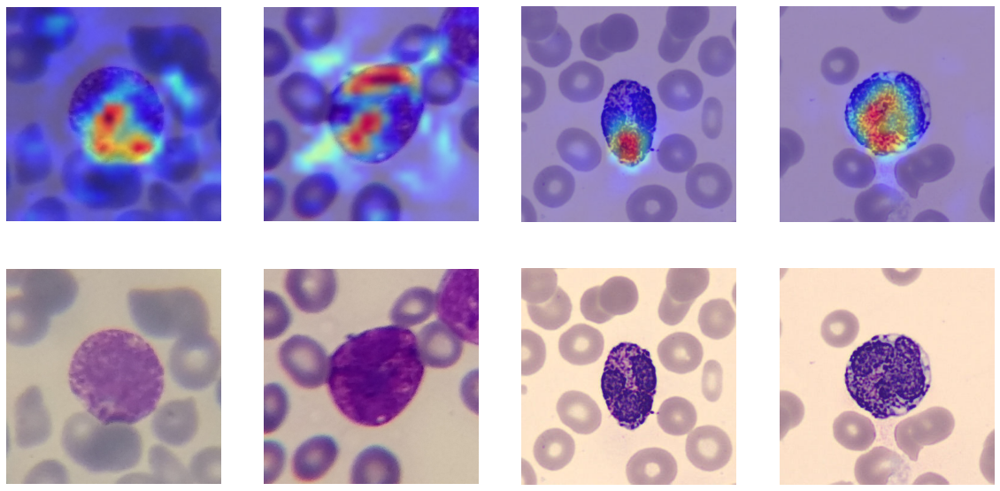

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes = classes, label = "BA", save_path = save_path)

Le modèle semble se concentrer tantôt sur le noyau, tantôt sur les granulations basophiles présentes dans le cytoplasme (comme sur la dernière image, ce qui est davantage pertinent).

#### Neutrophiles de bande (BNE)

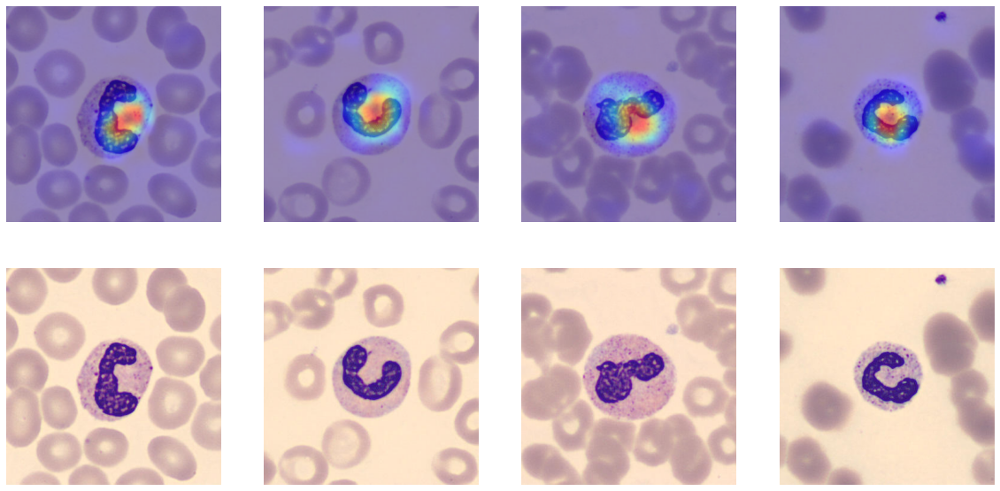

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "BNE", save_path)

Il semble que le modèle se concentre sur le centre de la cellule lorsqu'il attribue le label "BNE" à une image. Grad-CAM révèle que le modèle s'intéresse à une zone plutôt arrondie, située autour du centre de la cellule et du milieu de son noyau.

#### Éosinophiles (EO)

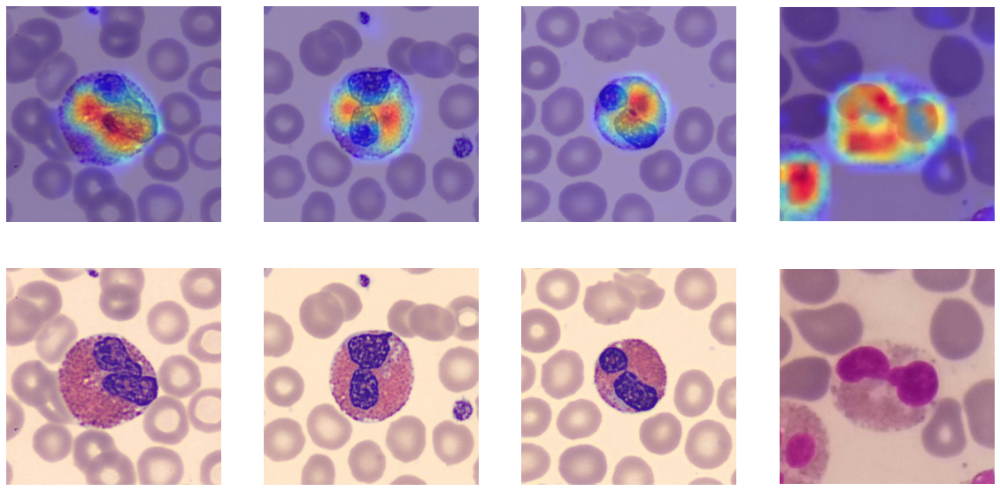

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "EO", save_path)

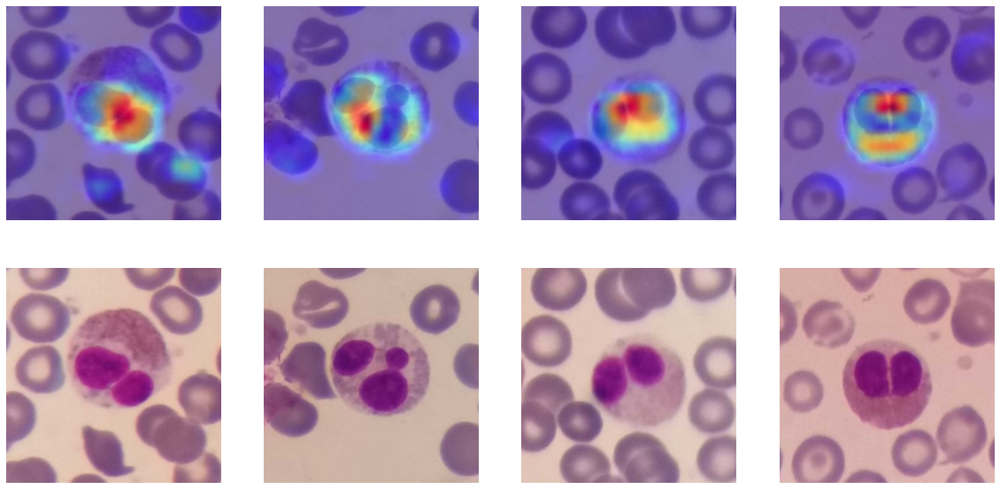

In [ ]:
print_gradcam_class(df_test[(df_test["well_classified"] == True) & (df_test["source"] == "Raabin")], classes, "EO", save_path)

Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.


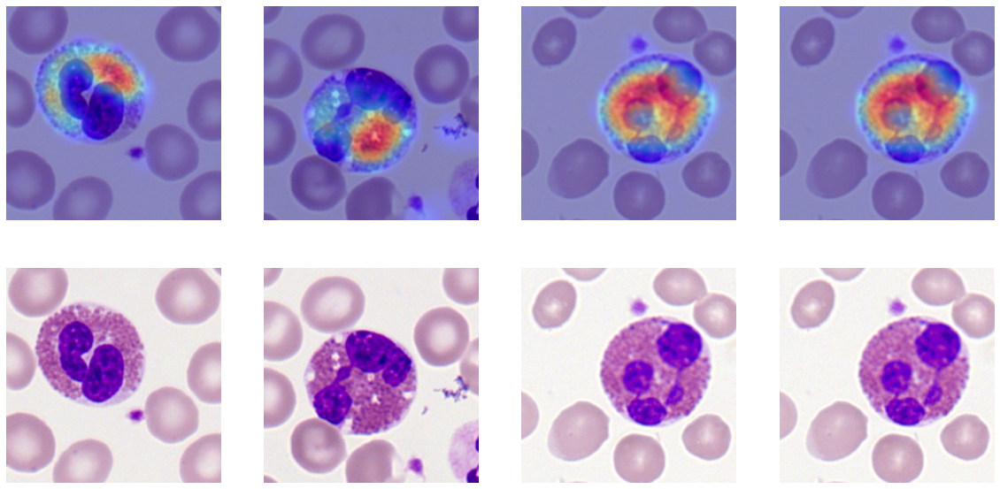

In [76]:
print_gradcam_class(df_test[(df_test["well_classified"] == True) & (df_test["source"] == "Munich")], classes, "EO", save_path)

C'est une classe pour laquelle le modèle est très performant. On remarque que pour Barcelone et Munich, **le modèle vise les granulations roses du cytoplasme** (ce qui est un critère pertinent pour identifier les éosinophiles). Pour Raabin la situation est différente : le modèle s'intéresse toujours au cytoplasme mais aussi à certaines portions du noyau.

La conclusion de tout ceci est que **le modèle semble, la plupart du temps, rechercher une nuance de rose** dans la cellule. Le noyau des EO est violet lorsque les images proviennent de Munich et Barcelone, alors que pour Raabin il est rose (ce rose ressemble assez à celui des granules des deux autres datasets).
Cela implique que dans ce cas précis le modèle est peut-être biaisé par les choix de colorants employés pour traiter les échantillons de sang.

#### Érythroblastes (ERB)

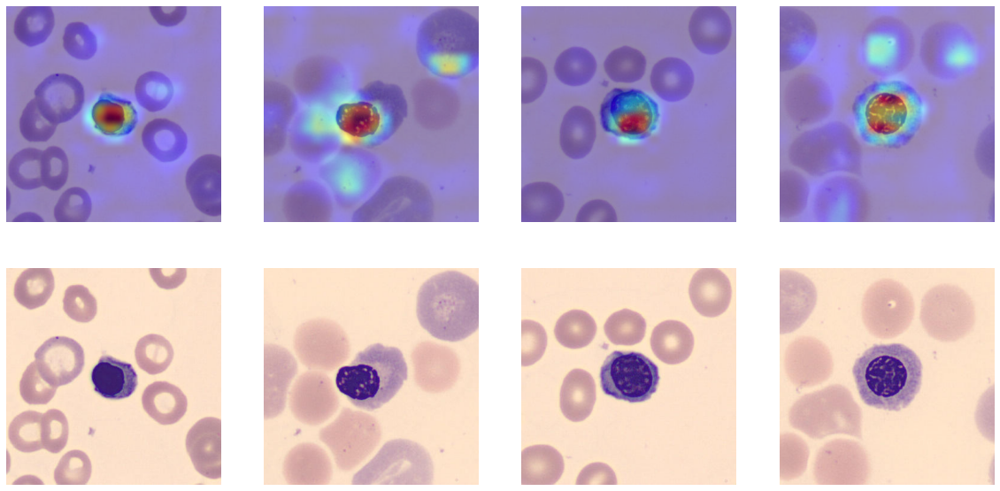

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "ERB", save_path)

Les érythroblastes sont de petites cellules, dont le noyau arrondi occupe une large portion du volume de la cellule. Le modèle se focalise essentiellement sur la cellule mais on remarque du déchet : le modèle accorde de l'intérêt à des cellules appartenant au fond de l'image.

*On notera que les ERB sont des précuseurs des globules rouges dépourvus de noyau qu'on voit sur toutes les images.*

#### Lymphocytes (LY)

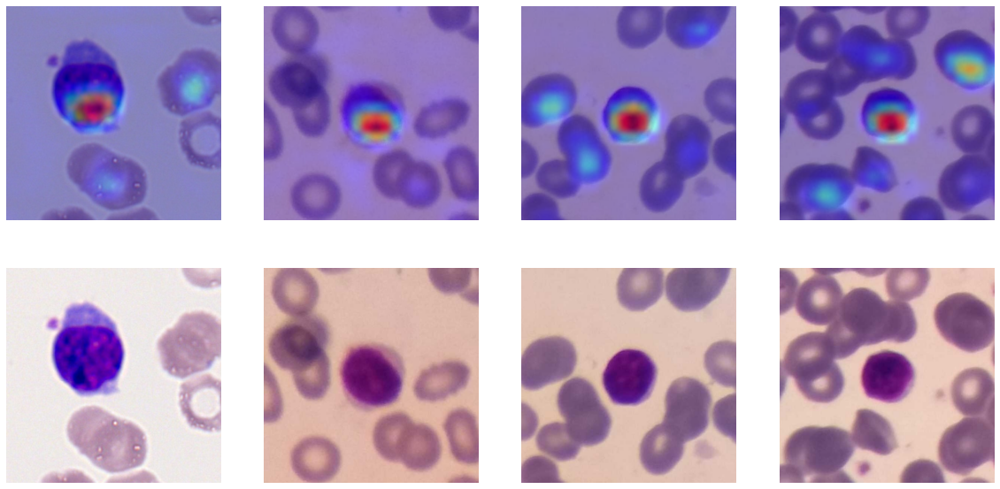

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "LY", save_path)

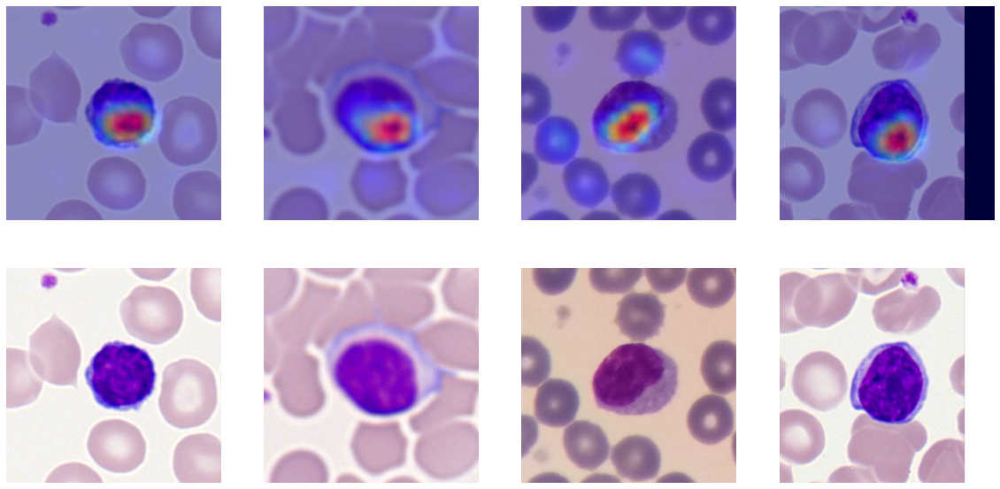

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "LY", save_path)

Il s'agît d'une autre classe pour laquelle le modèle est très performant, tous datasets confondus. **Le modèle focalise son attention sur la cellule**, dont le noyau occupe la quasi totalité du volume ce qui lui donne un aspect assez sombre.

Sur certaines images, on remarque que Grad-CAM met aussi en évidence des cellules appartenant au fond de l'image, **surtout lorsqu'elles sont sombres et qu'elles ont une taille comparable** à la cellule d'intérêt.

#### Métamyélocytes (MMY)

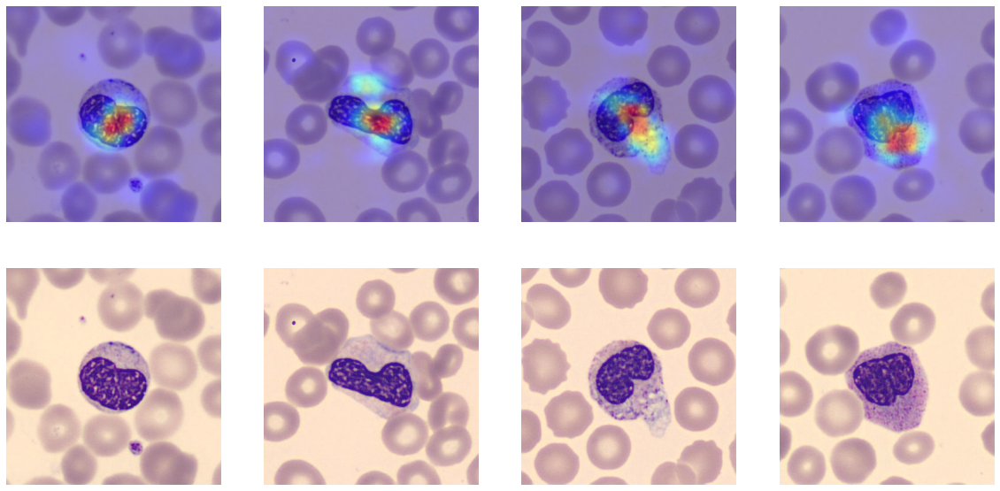

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "MMY", save_path)

#### Monocytes (MO)

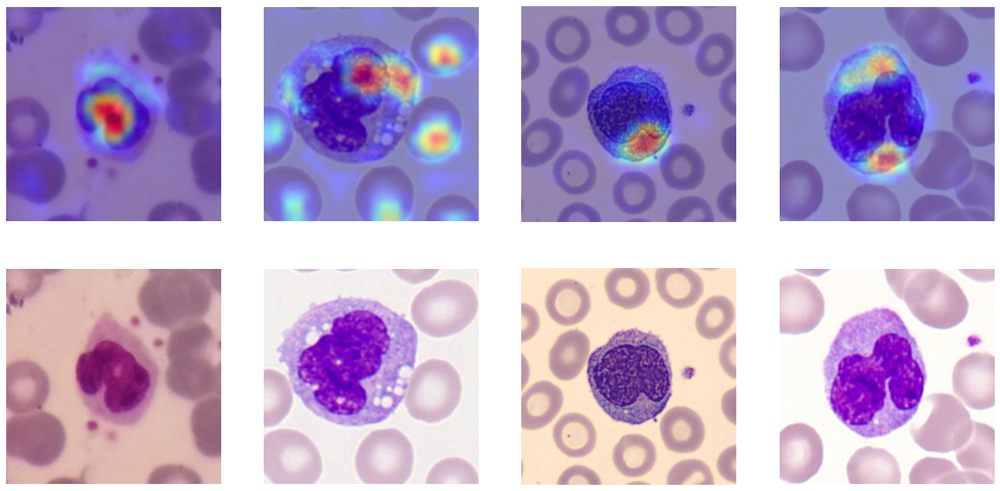

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "MO", save_path)

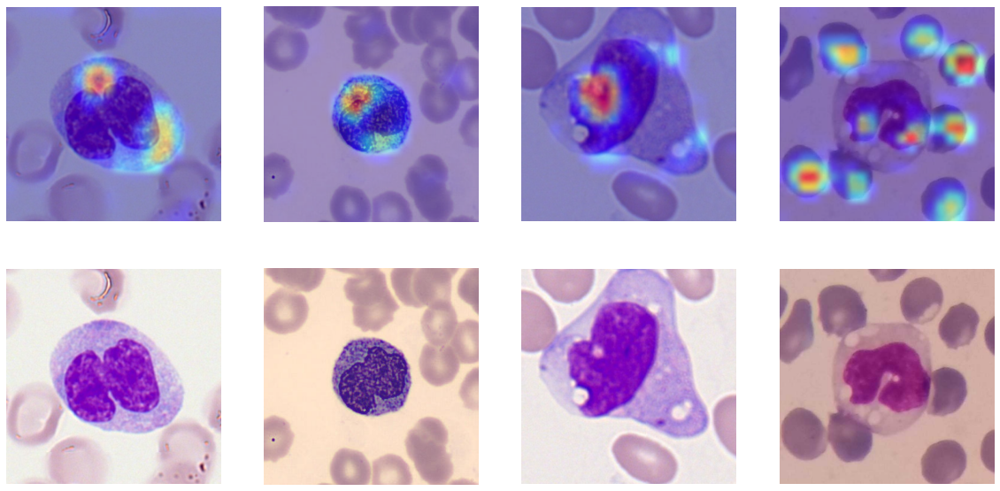

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "MO", save_path)

Pour les monocytes, Grad-CAM est plus difficile à interpréter. Dans la majorité des cas, il semblerait que le modèle cherche des "trous" ou des zones claires dans la cellule. Cela peut expliquer pourquoi le modèle cible parfois, en plus de la cellule d'intérêt, les zones claires des globules rouges. Ce phénomène apparait surtout sur les images de Raabin et Munich

#### Myélocytes (MY)

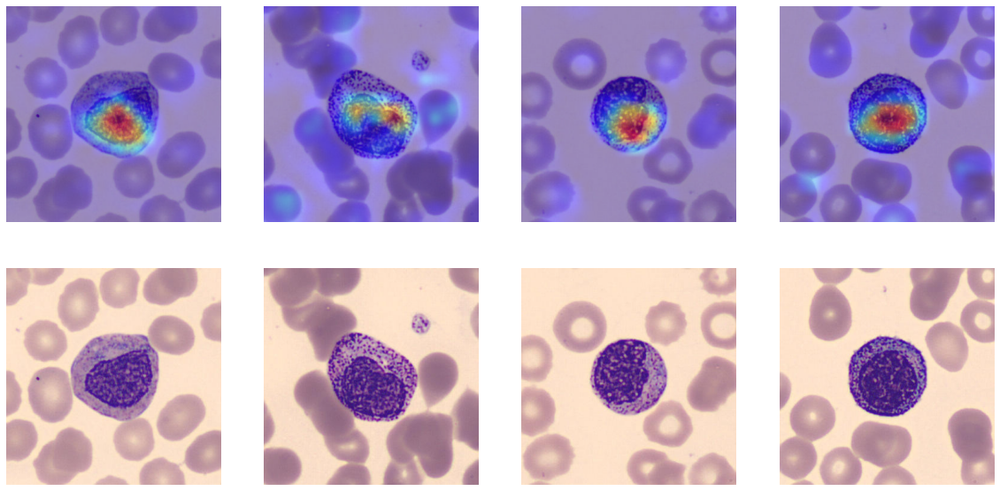

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "MY", save_path)

#### Plaquettes (PLT)

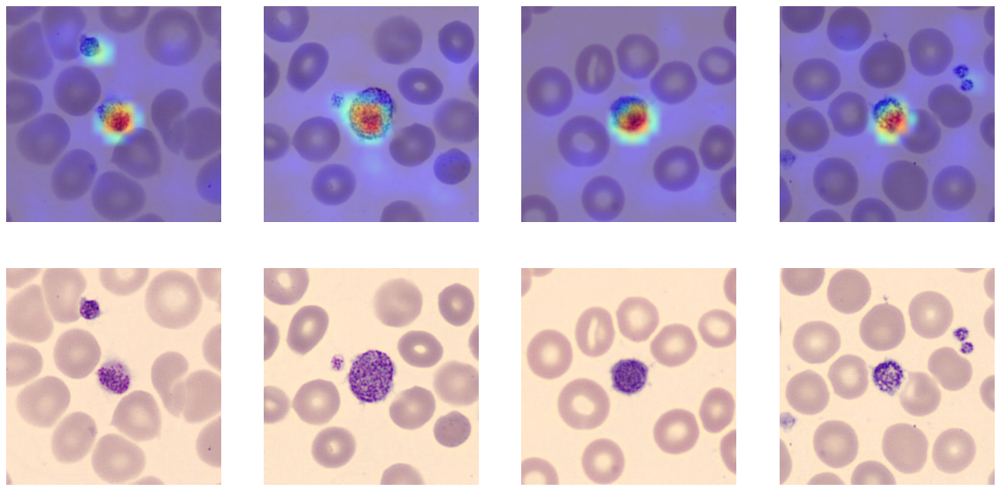

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "PLT", save_path)

Cela permet de compenser quelque peu le déchet remarqué sur la toute première image de Grad-CAM (Images bien classées - 1 échantillon par classe). On remarque sur la première image que le modèle détecte les deux plaquettes, alors qu'il ne le fait pas sur la quatrième.

#### Promyélocytes (PMY)

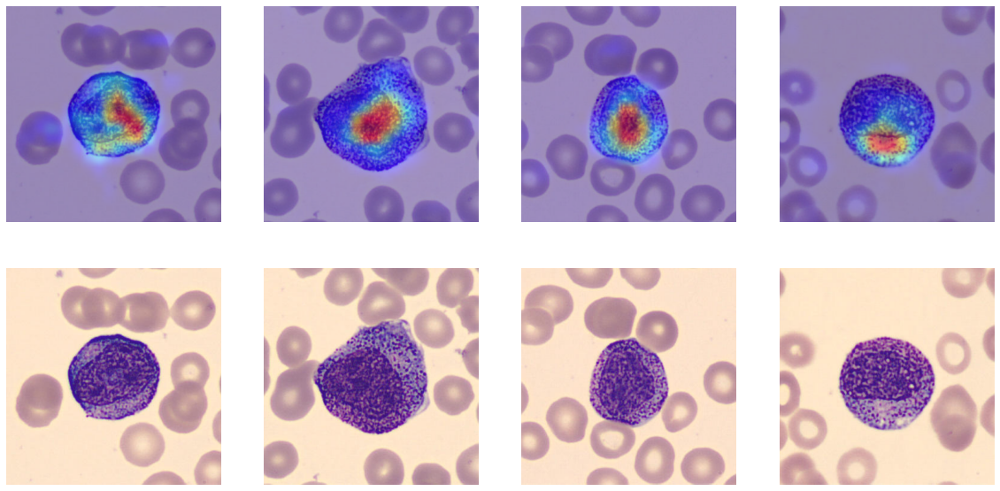

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "PMY", save_path)

#### Neutrophiles segmentés (SNE)

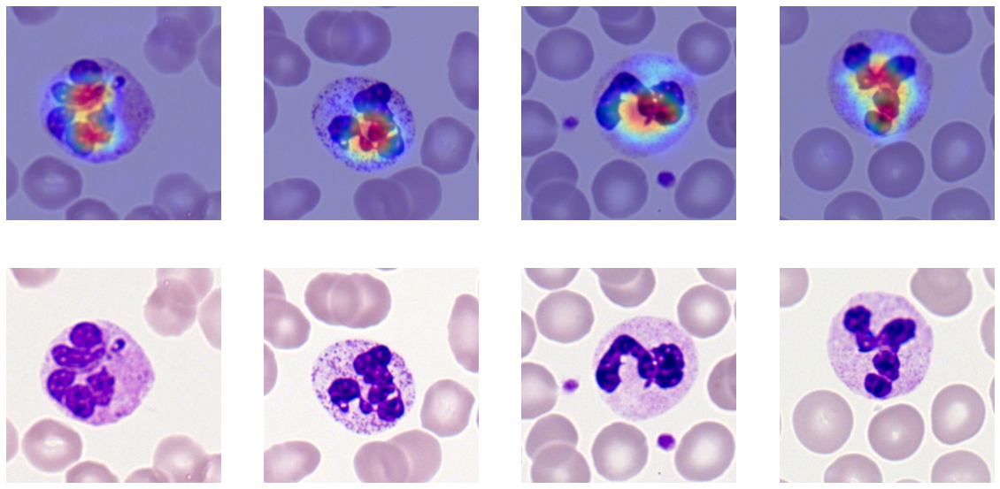

In [ ]:
print_gradcam_class(df_test[df_test["well_classified"] == True], classes, "SNE", save_path)

Le modèle cible plus ou moins le centre et le noyau de la cellule d'intérêt. Il accorde de l'attention aux régions là où le noyau prend une forme complexe (filaments et  lobes), caractéristique d'un granulocyte neutrophile arrivé à maturité.

**En conclusion générale :**
- on remarquera que le modèle, dans l'immense majorité des cas, accorde un maximum d'importance à la région centrale de l'image, là où se trouve la cellule d'intérêt. C'est une bonne chose et cela valide notre approche d'utiliser le Deep Learning en s'affranchissant des algorithmes de segmentation qui "découpent" autour de la cellule, qui sont lourds à implémenter et qui dépendent fortement des conditions de préparation des images, nuisant à la généralisabilité du modèle.

- on reconnaîtra que les résultats de Grad-CAM sont parfois difficiles à interpréter (surtout pour les PMY, les MY, les MMY qui sont les classes les plus difficiles à identifier les unes des autres)

### Images mal classées

On peut maintenant s'intéresser aux **images mal classées**. 
Regardons le nombre de **"faux positifs" obtenus** pour chaque classe :

In [ ]:
df_test[df_test["well_classified"] == False]["label_pred"].value_counts()

BNE    69
MMY    32
MY     27
SNE    21
LY     19
PMY    17
MO     11
BA      6
EO      5
ERB     5
Name: label_pred, dtype: int64

 Nous n'allons pas être exhaustifs et allons simplement regarder **deux cas** :

- le cas de MMY classés comme BNE (le successeur)
- le cas de SNE classés comme BNE (le précurseur)


#### MMY classés comme BNE

In [ ]:
df_test[(df_test["label"] == "MMY") & (df_test["label_pred"] == "BNE")]

,img_path,label,source,label_pred,well_classified
266,/content/dataset/MMY/MMZ_0008.tiff,MMY,Munich,BNE,False
1498,/content/dataset/MMY/MMY_601505.jpg,MMY,Barcelone,BNE,False
1962,/content/dataset/MMY/MMY_464019.jpg,MMY,Barcelone,BNE,False
3568,/content/dataset/MMY/MMY_24205.jpg,MMY,Barcelone,BNE,False


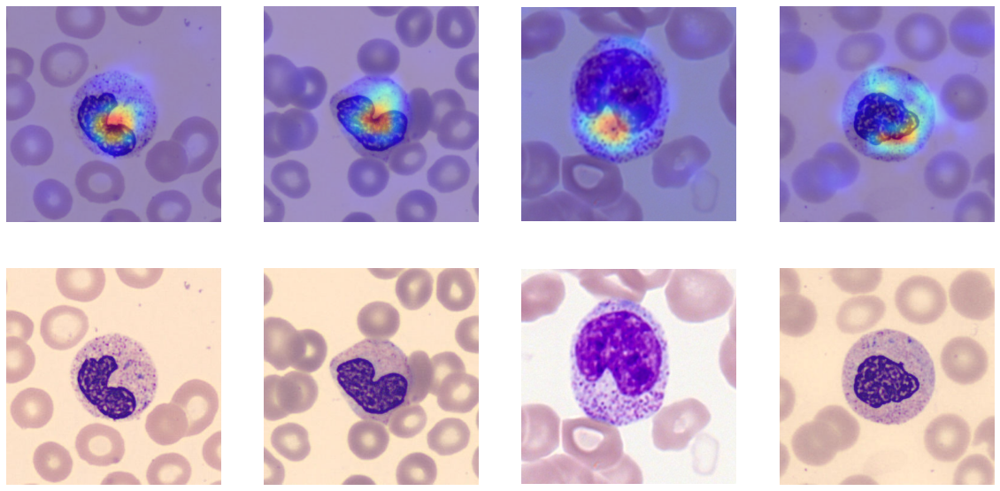

In [ ]:
print_gradcam_false(df_test[df_test["label"] == "MMY"], classes, "BNE", save_path)

Les deux premières cellules ont un noyau dont la forme commence à resssmbler à un "C", caractéristique d'un BNE : on peut comprendre la confusion. C'est nettement plus difficile pour la dernière image.

#### BNE classés comme SNE

In [ ]:
df_test[(df_test["label"] == "SNE") & (df_test["label_pred"] == "BNE")]

,img_path,label,source,label_pred,well_classified
14,/content/dataset/SNE/SNE_731589.jpg,SNE,Barcelone,BNE,False
19,/content/dataset/SNE/NGS_5076.tiff,SNE,Munich,BNE,False
22,/content/dataset/SNE/SNE_893261.jpg,SNE,Barcelone,BNE,False
82,/content/dataset/SNE/SNE_912821.jpg,SNE,Barcelone,BNE,False
157,/content/dataset/SNE/SNE_304432.jpg,SNE,Barcelone,BNE,False
...,...,...,...,...,...
3408,/content/dataset/SNE/SNE_832031.jpg,SNE,Barcelone,BNE,False
3461,/content/dataset/SNE/NGS_0042.tiff,SNE,Munich,BNE,False
3522,/content/dataset/SNE/NGS_8100.tiff,SNE,Munich,BNE,False
3665,/content/dataset/SNE/NGS_2337.tiff,SNE,Munich,BNE,False


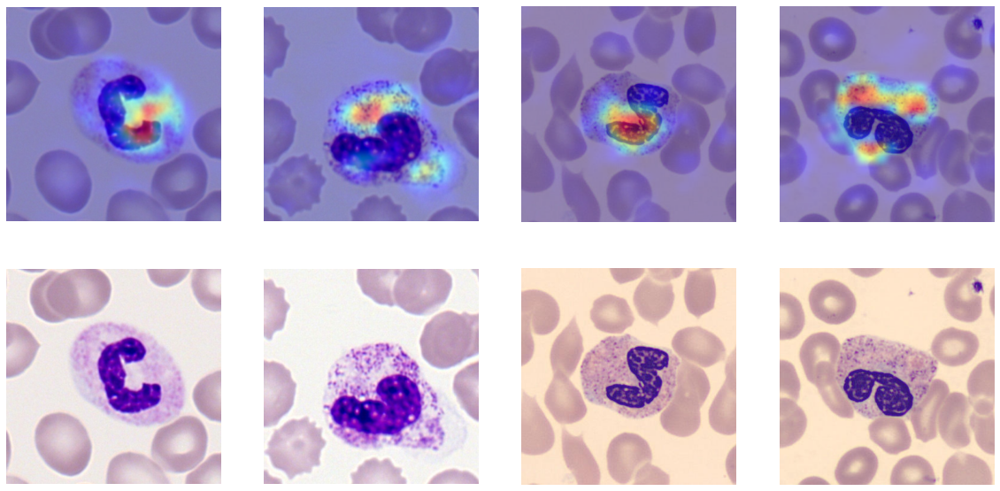

In [ ]:
print_gradcam_false(df_test[df_test["label"] == "SNE"], classes, "BNE", save_path)

On a ici affaire à des **cas problématiques** : si la dernière image fait bien penser à un SNE (on voit que le noyau est fait de deux lobes reliés par un filament), il est **difficile d'en dire autant** pour la troisième image si on se limite à la forme du noyau. On serait tenté de **penser à une erreur de label**.

Cependant, les SNE se distinguent des BNE par la forme du noyau mais aussi par la structure de la chromatine (les filaments sombres) qui se trouve à l'intérieur : elle est plus condensée pour un SNE et forme des paquets.

**Ces images correspondent peut-être à des cellules se trouvant quelque part entre le SNE "idéal" et le BNE "idéal"**, si tant est qu'ils existent : la chromatine semble condensée (donc plutôt SNE) mais la forme du noyau ne présente pas de lobes et des filaments évidents (donc plutôt BNE).

La conclusion de tout ceci est **peut-être que le modèle ne regarde pas de détails suffisamment fins** dans l'image.


## Prédiction

Finalement, on peut s'intéresser à **ce que fait le modèle pour une image en particulier**. Nous allons en profiter pour illustrer quelques cas concrets. Notamment :
- labels potentiellement erronés,
- images pouvant être considérées comme des "observations aberrantes" (outliers)

**NB :**  *Le rendu ci-dessous est proche de ce qui sera produit par l'application streamlit : le modèle renvoie les probabilités d'appartenance aux trois classes les plus probables, laissant la décision finale au praticien.*

### Fonctions

In [55]:
def full_prediction(model, img_path, label = None, size = (img_height, img_width)):

  ## Prediction (with preprocessing)
  img = get_img_array_2(img_path, size = size)
  probas = model.predict(img)[0]
  sorted_indexes = np.flip(np.argsort(probas))
  sorted_classes = [classes[i] for i in sorted_indexes]
  sorted_probas = [probas[i] for i in sorted_indexes]
  
  ## Plot (3 classes les plus probables)
  fig = plt.figure(figsize = (12,12))

  # Image d'origine, sans preprocessing
  ax1 = fig.add_subplot(2,2,1)
  ax1.imshow(plt.imread(img_path))
  ax1.text(x = 10, y = 25, s = 'P(%s) = %0.3f'%(sorted_classes[0], sorted_probas[0]), fontsize = 'xx-large')
  ax1.text(x = 10, y = 55, s = 'P(%s) = %0.3f'%(sorted_classes[1], sorted_probas[1]), fontsize = 'xx-large')
  ax1.text(x = 10, y = 85, s = 'P(%s) = %0.3f'%(sorted_classes[2], sorted_probas[2]), fontsize = 'xx-large')
  plt.grid(None)
  plt.axis('off')

  # GradCAM pour les 3 classes les plus probables :
  ax2 = fig.add_subplot(2,2,2)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[0], alpha = 0.8, plot = False)
  ax2.imshow(superimposed_img)
  ax2.set_title('Grad-CAM for '+sorted_classes[0], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  ax3 = fig.add_subplot(2,2,3)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[1], alpha = 0.8, plot = False)
  ax3.imshow(superimposed_img)
  ax3.set_title('Grad-CAM for '+sorted_classes[1], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  ax4 = fig.add_subplot(2,2,4)
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = sorted_indexes[2], alpha = 0.8, plot = False)
  ax4.imshow(superimposed_img)
  ax4.set_title('Grad-CAM for '+sorted_classes[2], fontsize = 24)
  plt.grid(None)
  plt.axis('off')

  if label == None:
    label = "Unknown"

  ax1.set_title('True label : '+label , fontsize = 24)

  return probas, sorted_probas, sorted_classes

### Exécution

#### Intérêt d'afficher les probabilités

**Cas n°1 :** on voit clairement que le modèle hésite entre SNE et BNE, et les lobes du noyau semblent en cours de formation. Ici, le modèle prédit correctement la classe.

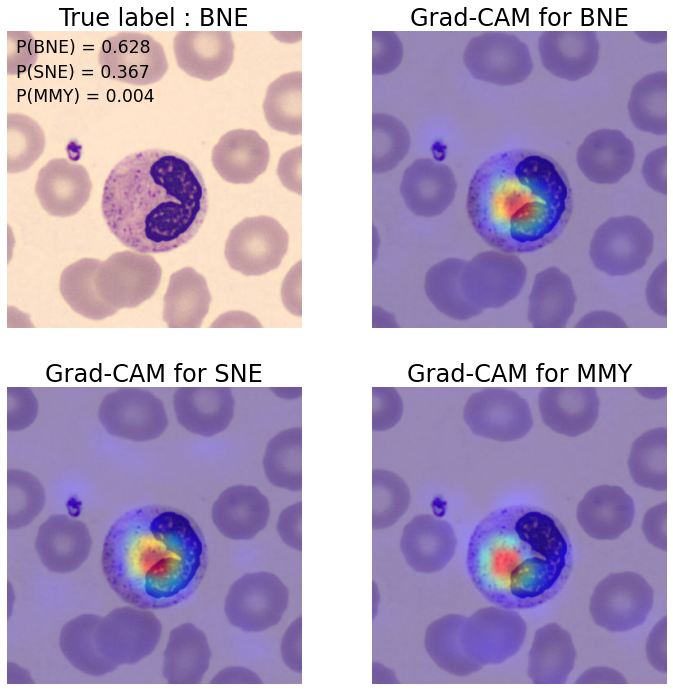

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/BNE/BNE_379446.jpg",
                                                        label = "BNE",
                                                        size = (img_height, img_width))

**Cas n°2 :** ici, l'hésitation (légitime) est encore plus forte et Grad-CAM n'est pas convaincante.

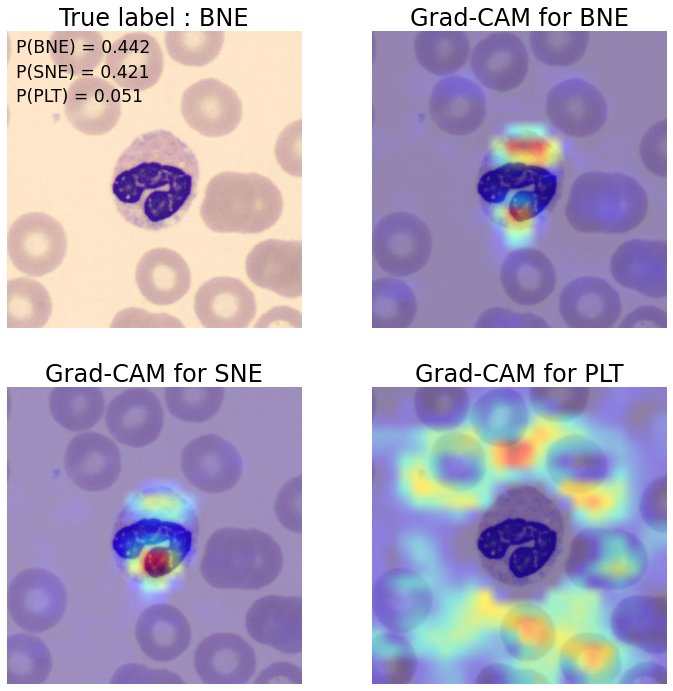

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/BNE/BNE_348065.jpg",
                                                        label = "BNE",
                                                        size = (img_height, img_width))

**Cas n°3 :** le modèle se trompe, mais le bon label est en deuxième position. Les probabilités montrent que le modèle hésite fortement.

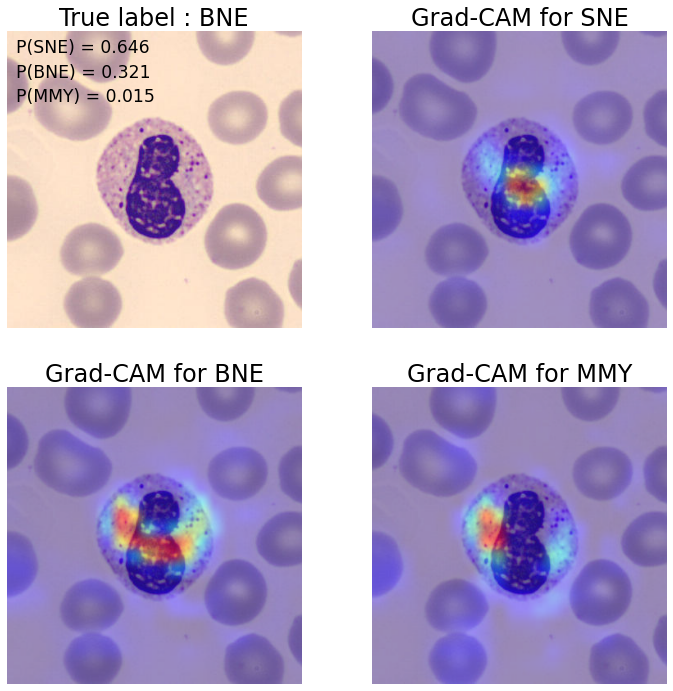

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/BNE/BNE_343960.jpg",
                                                        label = "BNE",
                                                        size = (img_height, img_width))

#### Label douteux

Dans l'exemple ci-dessous, le label semble erroné. Le noyau présente plusieurs lobes et n'a pas une forme de C ou de S. Il semble que la cellule soit un SNE et non un BNE. **Le modèle tranche franchement en faveur du SNE.**

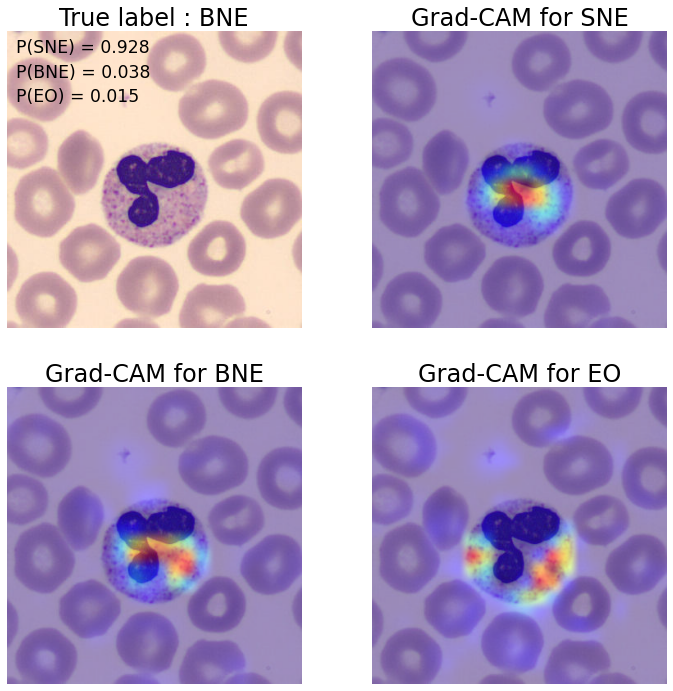

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/BNE/BNE_939116.jpg",
                                                        label = "BNE",
                                                        size = (img_height, img_width))

#### Outliers : cellules multiples sur l'image - impact du déséquilibre du dataset en terme de classes

Ici, on voit que le modèle se concentre sur le SNE qui se trouve au coin de l'image, au détriment du lymphocyte qui se trouve au centre. Ce type d'image est extrêmement rare dans le dataset, il n'est donc pas étonnant qu'elle soit mal classée.

Cependant, l'affichage de Grad-CAM est intéressant :
- lorsque Grad-CAM cherche un SNE, on voit que le modèle accorde de l'importance aux deux cellules.
- lorsqu'on configure Grad-CAM pour traquer un lymphocyte, la carte thermique montre que le modèle le trouve sans ambiguïté ... mais on obtient une carte d'activation moyenne similaire lorsque le modèle cherche un MO.

Au final, le modèle **semble trancher en faveur de l'objet qu'il reconnaît le mieux sur l'image**... ou **de la classe majoritaire du dataset**.

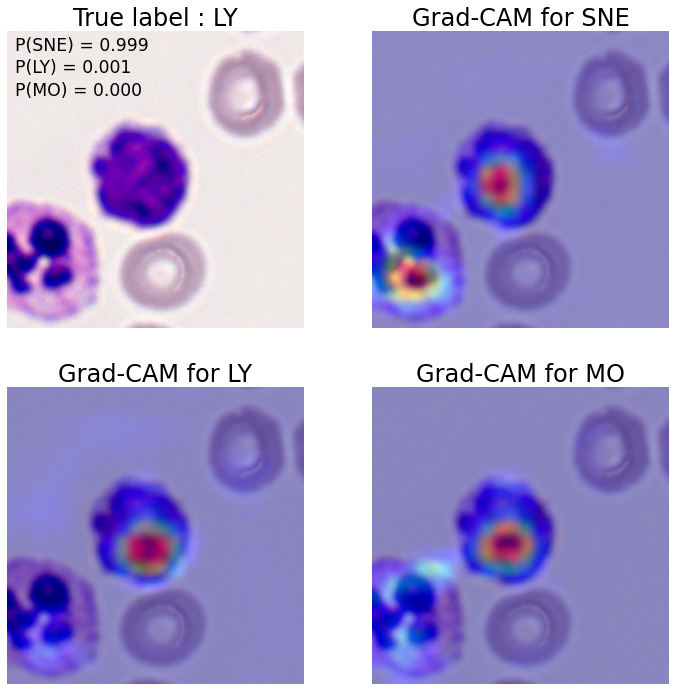

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/LY/LYT_2018.tiff",
                                                        label = "LY",
                                                        size = (img_height, img_width))

**Ce sentiment est renforcé par le cas ci-dessous**, similaire au précédent. Le modèle tranche en faveur du SNE et on voit avec Grad-CAM que la zone d'intérêt est davantage concentrée au milieu de l'image.

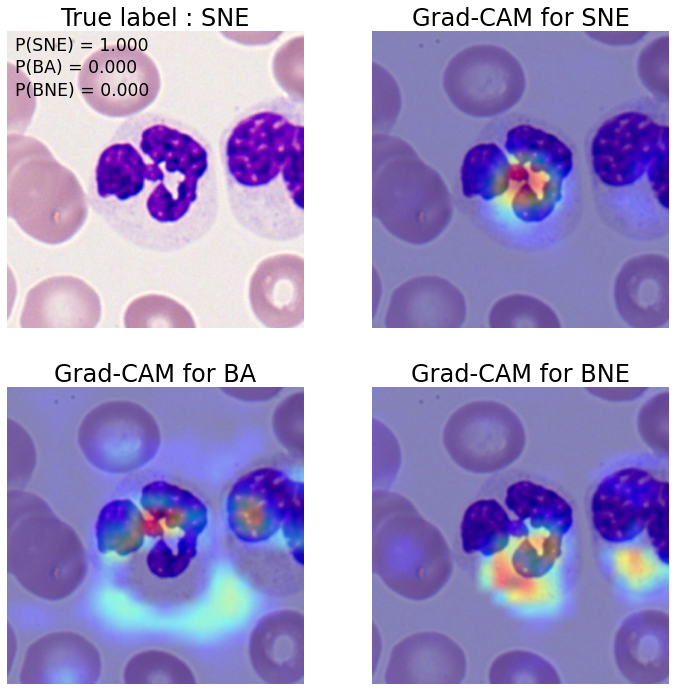

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/SNE/NGS_1586.tiff",
                                                        label = "SNE",
                                                        size = (img_height, img_width))

Dans l'exemple ci-dessous, **c'est encore une fois le SNE qui est repéré**, au détriment de la plaquette qui ne figure même pas dans la liste des trois classes les plus probables.

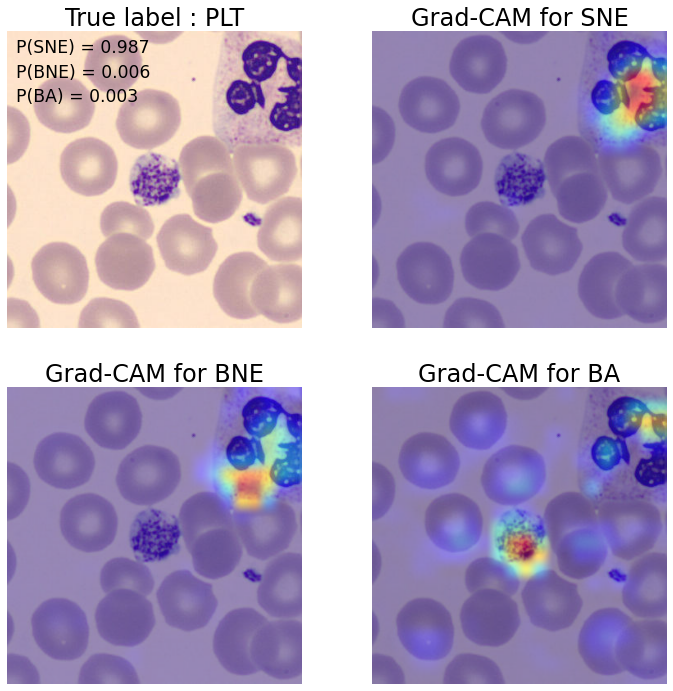

In [ ]:
probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = "/content/dataset/PLT/PLATELET_160909.jpg",
                                                        label = "PLT",
                                                        size = (img_height, img_width))

#### Tirage aléatoire d'une image et prédiction, pour explorer ...

Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
Found 1 validated image filenames.
/content/dataset/MMY/MMY_675168.jpg


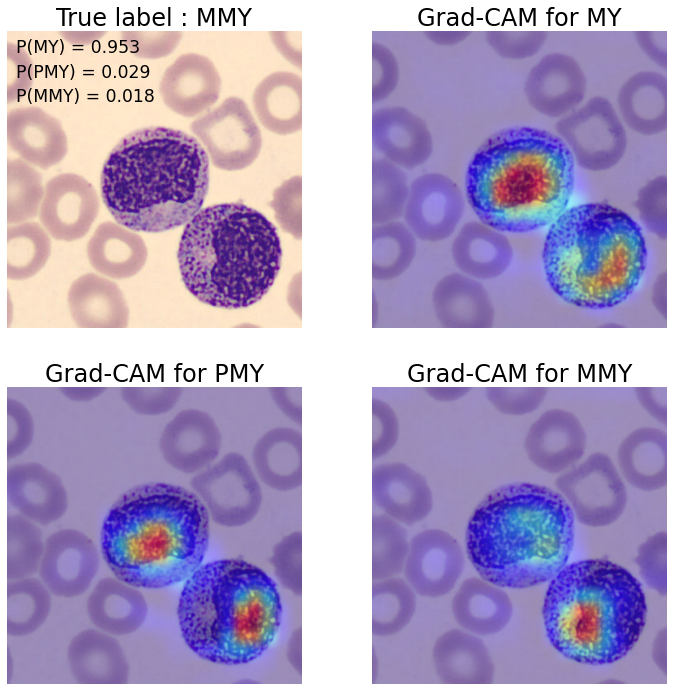

In [77]:
# Pour jouer avec le dataset

idx = np.random.choice(a = df_test[(df_test["label"] == "MMY") & (df_test["well_classified"] == False)].index)


probas, sorted_probas, sorted_classes = full_prediction(model,
                                                        img_path = df_test.loc[idx,"img_path"],
                                                        label = df_test.loc[idx,"label"],
                                                        size = (img_height, img_width))
print(df_test.loc[idx,"img_path"])